In [1]:
import cell_lineage_tracking as lineage
import tifffile
import matplotlib.pyplot as plt
from skimage.measure import find_contours
from skimage.draw import polygon
from matplotlib.collections import LineCollection
import pandas as pd
import numpy as np

In [2]:
def plot_kymograph_cells_id(phase_kymograph, fluor_kymograph, full_region_df, folder, fov_id, peak_id, fig_dir, track_id_col='track_id'):
    fig, ax = plt.subplots(2,1, figsize=(40, 10))

    # Get kymograph shape once for both calls
    kymograph_shape = phase_kymograph.shape

    ax[0].imshow(phase_kymograph, cmap = 'grey')
    _plot_cell_masks(ax[0], full_region_df, kymograph_shape, y_coord_col = 'centroid_y', x_coord_col = 'centroid_x', lineage_col = track_id_col)
    ax[0].set_yticks([])
    ax[0].set_xticks([])
    ax[0].set_title(f'Phase Kymograph - {folder} FOV: {fov_id}, trench: {peak_id}')

    ax[1].imshow(fluor_kymograph, cmap = 'grey')
    _plot_cell_masks(ax[1], full_region_df, kymograph_shape, y_coord_col = 'centroid_y', x_coord_col = 'centroid_x', lineage_col = track_id_col)
    ax[1].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_title(f'Fluorescence Kymograph - {folder} FOV: {fov_id}, trench: {peak_id}')

    plt.xlabel("Time frames")
    plt.tight_layout()
    #plt.savefig(fig_dir)
    #plt.close(fig)

def _plot_cell_masks(ax, full_region_df, kymograph_shape, y_coord_col = 'centroid_y', x_coord_col = 'centroid_x', lineage_col = None):
    default_cell_contour_color = '#AA5486'
    default_centroid_color = '#FC8F54'
    text_color = 'white' # Color for the track ID text
    text_offset_x = 5 # Offset the text slightly from the centroid to avoid overlap
    text_offset_y = 0

    # Prepare data for LineCollection for contours
    all_contours_segments = []
    all_contour_colors = []
    
    # Prepare data for centroids
    centroid_x_coords = []
    centroid_y_coords = []
    centroid_colors = []

    all_text_params = []

    if lineage_col:
        unique_track_ids = full_region_df[lineage_col].dropna().unique()
        colors_cmap = plt.get_cmap('tab20', len(unique_track_ids))
        track_colors = {track_id: colors_cmap(i) for i, track_id in enumerate(unique_track_ids)}

    for index, region_props in full_region_df.iterrows():
        # 'coords' are assumed to be (row, col) pixels within the mask
        cell_pixel_coords = np.array(region_props['coords']) # e.g., [[r1,c1], [r2,c2], ...]

        # Calculate bounding box for the current cell's mask
        min_row, min_col = np.min(cell_pixel_coords, axis=0)
        max_row, max_col = np.max(cell_pixel_coords, axis=0)

        # Create a small temporary mask for the current cell
        # Add a small buffer to ensure contours are fully captured if they go to edge
        buffer = 1
        bbox_min_row = max(0, min_row - buffer)
        bbox_min_col = max(0, min_col - buffer)
        bbox_max_row = min(kymograph_shape[0], max_row + buffer)
        bbox_max_col = min(kymograph_shape[1], max_col + buffer)

        temp_mask_shape = (bbox_max_row - bbox_min_row + 1, bbox_max_col - bbox_min_col + 1)
        temp_mask = np.zeros(temp_mask_shape, dtype=np.uint8)

        # Map cell_pixel_coords to relative coordinates within temp_mask
        relative_rows = cell_pixel_coords[:, 0] - bbox_min_row
        relative_cols = cell_pixel_coords[:, 1] - bbox_min_col
        
        # Populate the temporary mask
        temp_mask[relative_rows, relative_cols] = 1

        # Find contours on this small temporary mask
        # level=0.5 means it finds contours at the boundary between 0 and 1
        # fully_connected='high' means it considers 8-connectivity for background, 4-connectivity for foreground
        contours = find_contours(temp_mask, level=0.5, fully_connected='high')

        if not contours:
            continue # Skip if no contour found (e.g., single pixel or degenerate mask)

        # `find_contours` returns (row, col) coordinates for the contour.
        # We need to convert them back to global kymograph coordinates.
        # And convert to (x, y) for plotting (col, row)
        global_contours = []
        for contour in contours:
            # Shift back to global coordinates and swap for (x, y) plotting
            global_contour_x = contour[:, 1] + bbox_min_col
            global_contour_y = contour[:, 0] + bbox_min_row
            global_contours.append(np.vstack([global_contour_x, global_contour_y]).T)

        y_coord = region_props[y_coord_col]
        x_coord = region_props[x_coord_col]
        
        # Determine color for the current cell
        if lineage_col and region_props[lineage_col] in track_colors:
            current_color = track_colors[region_props[lineage_col]]
        else:
            current_color = default_cell_contour_color

        # Add all contours for this cell to the main list, with the determined color
        for contour_segment in global_contours:
            all_contours_segments.append(contour_segment)
            all_contour_colors.append(current_color)
            
        # Add centroid data
        centroid_x_coords.append(x_coord)
        centroid_y_coords.append(y_coord)
        centroid_colors.append(current_color if lineage_col else default_centroid_color)
        
        # --- Add Track ID Text ---
        if lineage_col and pd.notna(region_props[lineage_col]):
            track_id = region_props[lineage_col]
            # Convert track_id to int if it's a float, for cleaner display
            if isinstance(track_id, float) and track_id.is_integer():
                track_id_display = int(track_id)
            else:
                track_id_display = track_id

            all_text_params.append({
                'x': x_coord + text_offset_x,
                'y': y_coord + text_offset_y,
                's': str(track_id_display),
                'color': text_color,
                'fontsize': 8,
                'ha': 'left', # horizontal alignment
                'va': 'center', # vertical alignment
                'bbox': dict(facecolor=current_color, edgecolor='none', alpha=0.6, pad=1.0) # Background box
            })

    # Plot all cell contours at once using LineCollection
    if all_contours_segments: # Only plot if there are segments to draw
        line_collection = LineCollection(all_contours_segments, colors=all_contour_colors, linewidths=0.5)
        ax.add_collection(line_collection)

    # Plot all centroids at once using scatter
    if centroid_x_coords: # Only plot if there are centroids
        ax.scatter(centroid_x_coords, centroid_y_coords, color=centroid_colors, s=5, zorder=2)
    # Plot all track ID text at once
    for params in all_text_params:
        ax.text(params['x'], params['y'], params['s'], color=params['color'],
                fontsize=params['fontsize'], ha=params['ha'], va=params['va'],
                bbox=params['bbox'])

folder = 'DUMM_CL008_giTG068_072925'
all_cells_filename = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/all_cell_data_{folder}.pkl'
all_cells_pd = pd.read_pickle(all_cells_filename)

all_cells_pd.rename(columns = {'centroid-0': 'centroid_y','centroid-1': 'centroid_x'}, inplace = True)
all_cells_pd.loc[:,'node_id'] = all_cells_pd.index # Assign unique global node ID

all_cells_pd['track_id'] = all_cells_pd['track_id'].astype(np.int64)
all_cells_pd['track_id'] = all_cells_pd['track_id'].astype(str)

all_cells_pd.loc[:, 'ground_truth_lineage'] = None
all_cells_pd.loc[all_cells_pd['trench_id'] =='295', 'ground_truth_lineage']= all_cells_pd.loc[all_cells_pd['trench_id'] =='295','track_id'].map(ground_truth_lineage_id_dict_295)
all_cells_pd.loc[all_cells_pd['trench_id'] =='371', 'ground_truth_lineage']= all_cells_pd.loc[all_cells_pd['trench_id'] =='371','track_id'].map(ground_truth_lineage_id_dict_371)

all_cells_pd.to_pickle(all_cells_filename)

exp_view = folder
fov_view = '007'
trench_view = '295'
df_view = all_cells_pd[(all_cells_pd['experiment_name']==exp_view) &
                       (all_cells_pd['FOV']==fov_view) &
                       (all_cells_pd['trench_id']==trench_view)].copy()


# path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/drift_cor_DuMM_xy005_re_c0_2025-Jun-3-001/Fast4DReg/rotated/mm_channels/subtracted/{fov_view}_{trench_view}.tif'
# path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}//hyperstacked/drift_corrected/drift_cor_DuMM_xy005_re_c0_2025-Jun-3-001/Fast4DReg/rotated/mm_channels/subtracted/fluor/{fov_view}_{trench_view}.tif'


path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/{fov_view}_{trench_view}.tif'
path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/fluor/{fov_view}_{trench_view}.tif'
phase_kymograph = tifffile.imread(path_to_phase_kymograph)
fluor_kymograph = tifffile.imread(path_to_fluor_kymograph)

plot_kymograph_cells_id(phase_kymograph, fluor_kymograph, 
                                    df_view, 
                                    exp_view, fov_view, trench_view, 
                                    None, 
                                    track_id_col='track_id')

In [3]:
#for fov 007 and trench id 295
# manually correcting lineages id from track id
ground_truth_lineage_id_dict_295 = {'7': 'A',
                                '25':'A.1',
                                '46':'A.1',
                                '67':'A.1',
                                '73':'A.1.1',
                                '79':'A.1.1',
                                '97':'A.1.1',
                                '102':'A.1.1',
                                '108':'A.1.1',
                                '115':'A.1.1',
                                '119':'A.1.1',
                                '124':'A.1.1',
                                '130':'A.1.1',
                                '132':'A.1.1',
                                '135':'A.1.1',
                                '140':'A.1.1',
                                '142':'A.1.1',
                                '143':'A.1.1.1',
                                '151':'A.1.1.1',
                                '154':'A.1.1.1',
                                '159':'A.1.1.1',
                                '163':'A.1.1.1',
                                '167':'A.1.1.1',
                                '172':'A.1.1.1',
                                '178':'A.1.1.1',
                                '183':'A.1.1.1',
                                '144':'A.1.1.2',
                                '152':'A.1.1.2',
                                '155':'A.1.1.2',
                                '160':'A.1.1.2',
                                '164':'A.1.1.2',
                                '168':'A.1.1.2',
                                '173':'A.1.1.2',
                                '179':'A.1.1.2',
                                '184':'A.1.1.2',
                                '187':'A.1.1.2',
                                '191':'A.1.1.2',
                                '196':'A.1.1.2',
                                '202':'A.1.1.2',
                                '74':'A.1.2',
                                '80':'A.1.2',
                                '93':'A.1.2',
                                '109':'A.1.2',
                                '120':'A.1.2',
                                '125':'A.1.2',
                                '131':'A.1.2',
                                '133':'A.1.2',
                                '136':'A.1.2',
                                '141':'A.1.2',
                                '145':'A.1.2.1',
                                '150':'A.1.2.1',
                                '156':'A.1.2.1',
                                '161':'A.1.2.1',
                                '169':'A.1.2.1',
                                '174':'A.1.2.1',
                                '180':'A.1.2.1',
                                '188':'A.1.2.1',
                                '192':'A.1.2.1',
                                '197':'A.1.2.1',
                                '203':'A.1.2.1',
                                '208':'A.1.2.1',
                                '213':'A.1.2.1',
                                '146':'A.1.2.2',
                                '162':'A.1.2.2',
                                '165':'A.1.2.2',
                                '170':'A.1.2.2',
                                '175':'A.1.2.2',
                                '181':'A.1.2.2',
                                '193':'A.1.2.2',
                                '198':'A.1.2.2',
                                '204':'A.1.2.2',
                                '209':'A.1.2.2',
                                '216':'A.1.2.2',
                                '222':'A.1.2.2',
                                '74':'A.1.2',
                                '19': 'A.2',
                                '81': 'A.2.1',
                                '88':'A.2.1',
                                '94':'A.2.1',
                                '137':'A.2.1',
                                '147':'A.2.1.1',
                                '166':'A.2.1.1',
                                '176':'A.2.1.1',
                                '182':'A.2.1.1',
                                '189':'A.2.1.1',
                                '194':'A.2.1.1',
                                '199':'A.2.1.1',
                                '205':'A.2.1.1',
                                '210':'A.2.1.1',
                                '217':'A.2.1.1',
                                '223':'A.2.1.1',
                                '229':'A.2.1.1',
                                '234':'A.2.1.1',
                                '148':'A.2.1.2',
                                '157':'A.2.1.2',
                                '177':'A.2.1.2',
                                '195':'A.2.1.2',
                                '206':'A.2.1.2',
                                '211':'A.2.1.2',
                                '214':'A.2.1.2',
                                '218':'A.2.1.2',
                                '224':'A.2.1.2.1',
                                '230':'A.2.1.2.1',
                                '235':'A.2.1.2.1',
                                '240':'A.2.1.2.1',
                                '245':'A.2.1.2.1',
                                '249':'A.2.1.2.1',
                                '225':'A.2.1.2.2',
                                '82': 'A.2.2',
                                '138':'A.2.2.1',
                                '158':'A.2.2.1',
                                '171':'A.2.2.1',
                                '190':'A.2.2.1',
                                '207':'A.2.2.1',
                                '212':'A.2.2.1',
                                '220':'A.2.2.1',
                                '227':'A.2.2.1',
                                '232':'A.2.2.1',
                                '238':'A.2.2.1',
                                '243':'A.2.2.1',
                                '247':'A.2.2.1',
                                '255':'A.2.2.1',
                                '258':'A.2.2.1',
                                '262':'A.2.2.1',
                                '264':'A.2.2.1',
                                '267':'A.2.2.1.1',
                                '268':'A.2.2.1.2',
                                '139':'A.2.2.2',
                                '200': 'A.2.2.2.1',
                                '215': 'A.2.2.2.1',
                                '221': 'A.2.2.2.1',
                                '228': 'A.2.2.2.1',
                                '233': 'A.2.2.2.1',
                                '239': 'A.2.2.2.1',
                                '244': 'A.2.2.2.1',
                                '248': 'A.2.2.2.1',
                                '252': 'A.2.2.2.1',
                                '256': 'A.2.2.2.1',
                                '259': 'A.2.2.2.1',
                                '263': 'A.2.2.2.1',
                                '265': 'A.2.2.2.1',
                                '266': 'A.2.2.2.1',
                                '269': 'A.2.2.2.1',
                                '272': 'A.2.2.2.1',
                                '274': 'A.2.2.2.1',
                                '201': 'A.2.2.2.2',
                                '273': 'A.2.2.2.2',
                                '277': 'A.2.2.2.2',
                                '278': 'A.2.2.2.2.1',
                                '280': 'A.2.2.2.2.1',
                                '281': 'A.2.2.2.2.1',
                                '282': 'A.2.2.2.2.1',
                                '283': 'A.2.2.2.2.1',
                                '284': 'A.2.2.2.2.1',
                                '285': 'A.2.2.2.2.1',
                                '286': 'A.2.2.2.2.1',
                                '287': 'A.2.2.2.2.1.1',
                                '288': 'A.2.2.2.2.1.2',
                                '279': 'A.2.2.2.2.2',
                                '289': 'A.2.2.2.2.1',
                                '291': 'A.2.2.2.2.1',
                                '292': 'A.2.2.2.2.1',
                                '293': 'A.2.2.2.2.1',
                                '294': 'A.2.2.2.2.1',
                                '295': 'A.2.2.2.2.1',
                                '296': 'A.2.2.2.2.1',
                                '297': 'A.2.2.2.2.1',
                                '298': 'A.2.2.2.2.1',
                                '290': 'A.2.2.2.2.2.2',
                                '299': 'A.2.2.2.2.2.2',
                                '300': 'A.2.2.2.2.2.2',
                                '301': 'A.2.2.2.2.2.2',
                                '302': 'A.2.2.2.2.2.2.1',
                                '304': 'A.2.2.2.2.2.2.1',
                                '305': 'A.2.2.2.2.2.2.1',
                                '306': 'A.2.2.2.2.2.2.1',
                                '307': 'A.2.2.2.2.2.2.1',
                                '308': 'A.2.2.2.2.2.2.1',
                                '309': 'A.2.2.2.2.2.2.1',
                                '303': 'A.2.2.2.2.2.2.2',
                                '310': 'A.2.2.2.2.2.2.2',
                                '311': 'A.2.2.2.2.2.2.2',
                                '312': 'A.2.2.2.2.2.2.2',
                                '313': 'A.2.2.2.2.2.2.2.1',
                                '315': 'A.2.2.2.2.2.2.2.1',
                                '316': 'A.2.2.2.2.2.2.2.1',
                                '317': 'A.2.2.2.2.2.2.2.1',
                                '318': 'A.2.2.2.2.2.2.2.1',
                                '319': 'A.2.2.2.2.2.2.2.1',
                                '320': 'A.2.2.2.2.2.2.2.1',
                                '314': 'A.2.2.2.2.2.2.2.2',
                                '321': 'A.2.2.2.2.2.2.2.2',
                                '322': 'A.2.2.2.2.2.2.2.2',
                                '323': 'A.2.2.2.2.2.2.2.2',
                                '324': 'A.2.2.2.2.2.2.2.2',
                                '325': 'A.2.2.2.2.2.2.2.2',
                                '326': 'A.2.2.2.2.2.2.2.2',
                                '327': 'A.2.2.2.2.2.2.2.2.1',
                                '329': 'A.2.2.2.2.2.2.2.2.1',
                                '330': 'A.2.2.2.2.2.2.2.2.1',
                                '328': 'A.2.2.2.2.2.2.2.2.2',
                                '331': 'A.2.2.2.2.2.2.2.2.2',
                                '332': 'A.2.2.2.2.2.2.2.2.2.1',
                                '333': 'A.2.2.2.2.2.2.2.2.2.2'}

In [11]:
#for fov 007 and trench id 371
# manually correcting lineages id from track id
ground_truth_lineage_id_dict_371 = {'11': 'A',
                                '12': 'A',
                                '13': 'A',
                                '14':'A.1',
                                '17':'A.1',
                                '20':'A.1',
                                '22':'A.1',
                                '24':'A.1',
                                '27':'A.1',
                                '30':'A.1.1',
                                '33':'A.1.1',
                                '36':'A.1.1',
                                '38':'A.1.1',
                                '15':'A.2',
                                '18':'A.2',
                                '21':'A.2',
                                '23':'A.2',
                                '25':'A.2.1',
                                '28':'A.2.1',
                                '35':'A.2.1',
                                '40':'A.2.1',
                                '26':'A.2.2',
                                '29':'A.2.2',
                                '41':'A.2.2.1',
                                '43':'A.2.2.1',
                                '45':'A.2.2.1',
                                '46':'A.2.2.1.1',
                                '48':'A.2.2.1.1',
                                '50':'A.2.2.1.1',
                                '53':'A.2.2.1.1',
                                '47':'A.2.2.1.2',
                                '49':'A.2.2.1.2',
                                '51':'A.2.2.1.2',
                                '54':'A.2.2.1.2',
                                '55':'A.2.2.1.2',
                                '58':'A.2.2.1.2',
                                '61':'A.2.2.1.2',
                                '64':'A.2.2.1.2',
                                '66':'A.2.2.1.2',
                                '67':'A.2.2.1.2',
                                '69':'A.2.2.1.2',
                                '42':'A.2.2.2',
                                '44':'A.2.2.2',
                                '52':'A.2.2.2',
                                '56':'A.2.2.2.1',
                                '62':'A.2.2.2.1',
                                '65':'A.2.2.2.1',
                                '70':'A.2.2.2.1',
                                '74':'A.2.2.2.1',
                                '57':'A.2.2.2.2',
                                '63':'A.2.2.2.2',
                                '71':'A.2.2.2.2',
                                '74':'A.2.2.2.1',
                                '76':'A.2.2.2.1.1',
                                '80':'A.2.2.2.1.1',
                                '86':'A.2.2.2.1.1',
                                '94':'A.2.2.2.1.1',
                                '97':'A.2.2.2.1.1',
                                '104':'A.2.2.2.1.1',
                                '77':'A.2.2.2.1.2',
                                '81':'A.2.2.2.1.2',
                                '87':'A.2.2.2.1.2',
                                '95':'A.2.2.2.1.2',
                                '98':'A.2.2.2.1.2',
                                '105':'A.2.2.2.1.2',
                                '106':'A.2.2.2.1.2',
                                '108':'A.2.2.2.1.2', 
                                '72':'A.2.2.1.2.1',
                                '78':'A.2.2.1.2.1',
                                '73':'A.2.2.1.2.2',
                                '79':'A.2.2.1.2.2',
                                '85':'A.2.2.1.2.2',
                                '89':'A.2.2.1.2.2',
                                '90':'A.2.2.1.2.2',
                                '101':'A.2.2.1.2.2',
                                '104':'A.2.2.1.2.2',
                                '82':'A.2.2.2.2.1',
                                '88':'A.2.2.2.2.1',
                                '107':'A.2.2.2.2.1',
                                '109':'A.2.2.2.2.1.1',
                                '114':'A.2.2.2.2.1.1',
                                '118':'A.2.2.2.2.1.1',
                                '121':'A.2.2.2.2.1.1',
                                '123':'A.2.2.2.2.1.1',
                                '124':'A.2.2.2.2.1.1',
                                '127':'A.2.2.2.2.1.1',
                                '129':'A.2.2.2.2.1.1',
                                '133':'A.2.2.2.2.1.1',
                                '135':'A.2.2.2.2.1.1',
                                '138':'A.2.2.2.2.1.1',
                                '144':'A.2.2.2.2.1.1.2',
                                '156':'A.2.2.2.2.1.1.2',
                                '162':'A.2.2.2.2.1.1.2',
                                '168':'A.2.2.2.2.1.1.2',
                                '172':'A.2.2.2.2.1.1.2',
                                '177':'A.2.2.2.2.1.1.2',
                                '182':'A.2.2.2.2.1.1.2',
                                '188':'A.2.2.2.2.1.1.2',
                                '196':'A.2.2.2.2.1.1.2',
                                '143':'A.2.2.2.2.1.1.1',
                                '150':'A.2.2.2.2.1.1.1',
                                '155':'A.2.2.2.2.1.1.1',
                                '161':'A.2.2.2.2.1.1.1',
                                '167':'A.2.2.2.2.1.1.1',
                                '170':'A.2.2.2.2.1.1.1.1',
                                '171':'A.2.2.2.2.1.1.1.2',
                                '110':'A.2.2.2.2.1.2',
                                '115':'A.2.2.2.2.1.2',
                                '130':'A.2.2.2.2.1.2',
                                '134':'A.2.2.2.2.1.2',
                                '136':'A.2.2.2.2.1.2',
                                '140':'A.2.2.2.2.1.2.2',
                                '152':'A.2.2.2.2.1.2.2',
                                '158':'A.2.2.2.2.1.2.2',
                                '164':'A.2.2.2.2.1.2.2',
                                '174':'A.2.2.2.2.1.2.2',
                                '179':'A.2.2.2.2.1.2.2',
                                '184':'A.2.2.2.2.1.2.2',
                                '190':'A.2.2.2.2.1.2.2',
                                '198':'A.2.2.2.2.1.2.2',
                                '204':'A.2.2.2.2.1.2.2',
                                '209':'A.2.2.2.2.1.2.2',
                                '213':'A.2.2.2.2.1.2.2',
                                '217':'A.2.2.2.2.1.2.2',
                                '223':'A.2.2.2.2.1.2.2.1',
                                '224':'A.2.2.2.2.1.2.2.2',
                                '139':'A.2.2.2.2.1.2.1',
                                '151':'A.2.2.2.2.1.2.1',
                                '157':'A.2.2.2.2.1.2.1',
                                '163':'A.2.2.2.2.1.2.1',
                                '169':'A.2.2.2.2.1.2.1',
                                '173':'A.2.2.2.2.1.2.1',
                                '178':'A.2.2.2.2.1.2.1',
                                '183':'A.2.2.2.2.1.2.1',
                                '189':'A.2.2.2.2.1.2.1',
                                '197':'A.2.2.2.2.1.2.1',
                                '203':'A.2.2.2.2.1.2.1',
                                '208':'A.2.2.2.2.1.2.1',
                                '212':'A.2.2.2.2.1.2.1',
                                '83':'A.2.2.2.2.2',
                                '91':'A.2.2.2.2.2',
                                '111':'A.2.2.2.2.2.1',
                                '116':'A.2.2.2.2.2.1',
                                '146':'A.2.2.2.2.2.1.1',
                                '165':'A.2.2.2.2.2.1.1',
                                '175':'A.2.2.2.2.2.1.1',
                                '185':'A.2.2.2.2.2.1.1',
                                '191':'A.2.2.2.2.2.1.1',
                                '199':'A.2.2.2.2.2.1.1',
                                '205':'A.2.2.2.2.2.1.1',
                                '210':'A.2.2.2.2.2.1.1',
                                '214':'A.2.2.2.2.2.1.1',
                                '218':'A.2.2.2.2.2.1.1',
                                '225':'A.2.2.2.2.2.1.1',
                                '230':'A.2.2.2.2.2.1.1.1',
                                '231':'A.2.2.2.2.2.1.1.2',
                                '112':'A.2.2.2.2.2.2',
                                '117':'A.2.2.2.2.2.2',
                                '122':'A.2.2.2.2.2.2',
                                '128':'A.2.2.2.2.2.2',
                                '137':'A.2.2.2.2.2.2'}

for key, value in ground_truth_lineage_id_dict_371.items():
    ground_truth_lineage_id_dict_371[key] = value.replace('A', 'G')

In [ ]:
ground_truth_lineage_id_dict_1061 = {
    '72': 'B.2.2',
    '94': 'B.2.2',
    '102': 'B.2.2',
    '122': 'B.2.2.2',
    '126': 'B.2.2.2',
    '129': 'B.2.2.2',
    '135': 'B.2.2.2',
    '136': 'B.2.2.2',
    '138': 'B.2.2.2',
    '139': 'B.2.2.2.1',
    '145': 'B.2.2.2.1',
    '140': 'B.2.2.2.2',

    
    '121': 'B.2.2.1',
    '128': 'B.2.2.1',
    '134': 'B.2.2.1',
    '143': 'B.2.2.1.1',
    '144': 'B.2.2.1.2',
    
    '3': 'B',
    '8': 'B',
    '12': 'B',
    '17': 'B.2',
    '66': 'B.2',
    '71': 'B.2.1',
    '93': 'B.2.1',
    '101': 'B.2.1',
    '119': 'B.2.1',
    '120': 'B.2.1',
    '123': 'B.2.1',
    '124': 'B.2.1',
    '127': 'B.2.1',
    '130': 'B.2.1.1',
    '132': 'B.2.1.1',
    '137': 'B.2.1.1',
    '141': 'B.2.1.1',
    '131': 'B.2.1.2',
    '133': 'B.2.1.2',
    '142': 'B.2.1.2',
    
    '44': 'B.1.2',
    '92': 'B.1.2',
    '114': 'B.1.2',
    '117': 'B.1.2.1',
    '118': 'B.1.2.2',
    
    '16': 'B.1',
    '43': 'B.1.1',
    '49': 'B.1.1',
    '54': 'B.1.1',
    '59': 'B.1.1',
    '65': 'B.1.1',
    '70': 'B.1.1',
    '80': 'B.1.1',
    '98': 'B.1.1',
    '113': 'B.1.1',
    '115': 'B.1.1.1',
    '116': 'B.1.1.2',

    '23': 'A.2.2',
    '31': 'A.2.2',
    '35': 'A.2.2',
    '42': 'A.2.2',
    '48': 'A.2.2',
    '53': 'A.2.2',
    '58': 'A.2.2',
    '64': 'A.2.2',
    '69': 'A.2.2',
    '84': 'A.2.2.1',
    '90': 'A.2.2.1',
    '105': 'A.2.2.1',
    '111': 'A.2.2.1',
    '85': 'A.2.2.2',
    '97': 'A.2.2.2',
    '112': 'A.2.2.2',
    
    '11': 'A.2',
    '22': 'A.2.1',
    '26': 'A.2.1',
    '28': 'A.2.1',
    '30': 'A.2.1',
    '34': 'A.2.1',
    '38': 'A.2.1',
    '41': 'A.2.1',
    '47': 'A.2.1',
    '52': 'A.2.1',
    '57': 'A.2.1',
    '63': 'A.2.1',
    '75': 'A.2.1',
    '78': 'A.2.1',
    '89': 'A.2.1',
    '95': 'A.2.1.1',
    '103': 'A.2.1.1',
    '109': 'A.2.1.1',
    '96': 'A.2.1.2',
    '104': 'A.2.1.2',
    '110': 'A.2.1.2',
    
    '2': 'A',
    '7': 'A',
    '10': 'A.1',
    '13': 'A.1',
    '14': 'A.1',
    '15': 'A.1',
    '18': 'A.1',
    '20': 'A.1',
    '21': 'A.1',
    '24': 'A.1',
    '25': 'A.1',
    '27': 'A.1',
    '29': 'A.1',
    '33': 'A.1.2',
    '37': 'A.1.2',
    '40': 'A.1.2',
    '46': 'A.1.2',
    '51': 'A.1.2',
    '74': 'A.1.2',
    '77': 'A.1.2',
    '81': 'A.1.2',
    
    '32': 'A.1.1',
    '36': 'A.1.1',
    '39': 'A.1.1',
    '45': 'A.1.1',
    '50': 'A.1.1',
    '55': 'A.1.1',
    '62': 'A.1.1',
    '67': 'A.1.1',
}

In [111]:
ground_truth_lineage_id_dict_1565 = {'203': 'H',
                                     '207': 'H',
                                     '209': 'H',
                                     '213': 'H',
                                     '216': 'H',
                                     '219': 'H',
                                     '227': 'H.1',
                                     '228': 'H.2',
                                     '296': 'G',
                                     '300': 'G.2',
                                     '306': 'G.2',
                                     '311': 'G.2',
                                     '314': 'G.2',
                                     '319': 'G.2',
                                     '322': 'G.2',
                                     '324': 'G.2',
                                     '299': 'G.1',
                                     '305': 'G.1',
                                     '310': 'G.1',
                                     '313': 'G.1',
                                     '318': 'G.1',
                                     '321': 'G.1',
                                     '226': 'F.1.2',
                                     '235': 'F.1.2',
                                     '241': 'F.1.2',
                                     '248': 'F.1.2',
                                     '252': 'F.1.2',
                                     '255': 'F.1.2',
                                     '257': 'F.1.2.1',
                                     '258': 'F.1.2.2',
                                     '212': 'F.2',
                                     '242': 'F.2',
                                     '249': 'F.2',
                                     '261': 'F.2',
                                     '275': 'F.2.2',
                                     '282': 'F.2.2',
                                     '287': 'F.2.2',
                                     '292': 'F.2.2',
                                     '295': 'F.2.2',
                                     '298': 'F.2.2',
                                     '302': 'F.2.2.2',
                                     '304': 'F.2.2.2',
                                     '309': 'F.2.2.2',
                                     '312': 'F.2.2.2',
                                     '317': 'F.2.2.2',
                                     '320': 'F.2.2.2',
                                     '323': 'F.2.2.2',
                                     '205': 'F',
                                     '211': 'F.1',
                                     '215': 'F.1',
                                     '218': 'F.1',
                                     '222': 'F.1',
                                     '225': 'F.1.1',
                                     '231': 'F.1.1',
                                     '234': 'F.1.1',
                                     '240': 'F.1.1',
                                     '247': 'F.1.1',
                                     '251': 'F.1.1',
                                     '254': 'F.1.1',
                                     '256': 'F.1.1',
                                     '259': 'F.1.1',
                                     '262': 'F.1.1.1',
                                     '267': 'F.1.1.1',
                                     '158': 'E.2',
                                     '163': 'E.2',
                                     '166': 'E.2',
                                     '169': 'E.2',
                                     '186': 'E.2.1',
                                     '187': 'E.2.2',
                                     '123': 'E',
                                     '132': 'E',
                                     '137': 'E',
                                     '140': 'E',
                                     '147': 'E',
                                     '151': 'E.1',
                                     '156': 'E.1',
                                     '157': 'E.1',
                                     '162': 'E.1',
                                     '165': 'E.1',
                                     '168': 'E.1',
                                     '172': 'E.1',
                                     '177': 'E.1',
                                     '184': 'E.1.1',
                                     '190': 'E.1.1',
                                     '185': 'E.1.2',
                                     '191': 'E.1.1',
                                     '122': 'D',
                                     '125': 'D',
                                     '126': 'D.1',
                                     '128': 'D.1',
                                     '130': 'D.1',
                                     '135': 'D.1',
                                     '138': 'D.1',
                                     '142': 'D.1',
                                     '127': 'D.2',
                                     '129': 'D.2',
                                     '131': 'D.2',
                                     '136': 'D.2',
                                     '139': 'D.2',
                                     '143': 'D.2',
                                     '150': 'D.2.2',
                                     '74': 'C.2',
                                     '92': 'C.2',
                                     '102': 'C.2.1',
                                     '107': 'C.2.1',
                                     '114': 'C.2.1',
                                    '117': 'C.1.2',
                                    '113': 'C.1.2',
                                    '111': 'C.1.2',
                                    '101': 'C.1.2',
                                     '91': 'C.1.2',
                                     '73': 'C.1',
                                     '79': 'C.1',
                                     '89': 'C.1',
                                     '91': 'C.1',
                                     '2': 'B',
                                     '4': 'B',
                                     '10': 'B.1',
                                     '19': 'B.1',
                                     '28': 'B.1',
                                     '11': 'B.2',
                                     '1': 'A',
                                     '3': 'A',
                                     '5': 'A',
                                     '6': 'A.1',
                                     '8': 'A.1',
                                     '14': 'A.1.1',
                                     '18': 'A.1.1',
                                     '20': 'A.1.1',
                                     '26': 'A.1.1',
                                     '29': 'A.1.1',
                                     '33': 'A.1.1',
                                     '7': 'A.2',
                                     '9': 'A.2',
                                     '15': 'A.2',
                                     '17': 'A.2',
                                     '23': 'A.2.2',
                                     '32': 'A.2.2',
                                     '46': 'A.2.2',
                                     '38': 'C',
                                     '42': 'C',
                                     '50': 'C',
                                     '54': 'C',
                                     '64': 'C'}

In [ ]:
ground_truth_lineage_id_dict_1826 = {
    '98': 'A.2.2.2.2',
    '107': 'A.2.2.2.2',
    '117': 'A.2.2.2.2.2',
    '143': 'A.2.2.2.2.2.2',
    '151': 'A.2.2.2.2.2.2',
    '167': 'A.2.2.2.2.2.2',
    '177': 'A.2.2.2.2.2.2',
    '179': 'A.2.2.2.2.2.2.2',
    '188': 'A.2.2.2.2.2.2.2.2',
    '203': 'A.2.2.2.2.2.2.2.2',
    '207': 'A.2.2.2.2.2.2.2.2',
    '212': 'A.2.2.2.2.2.2.2.2.1',
    '213': 'A.2.2.2.2.2.2.2.2.2',
    '187': 'A.2.2.2.2.2.2.2.1',
    '191': 'A.2.2.2.2.2.2.2.1',
    '194': 'A.2.2.2.2.2.2.2.1',
    '197': 'A.2.2.2.2.2.2.2.1',
    '202': 'A.2.2.2.2.2.2.2.1',
    '206': 'A.2.2.2.2.2.2.2.1',
    '210': 'A.2.2.2.2.2.2.2.1.1',
    '211': 'A.2.2.2.2.2.2.2.1.2',
    '178': 'A.2.2.2.2.2.2.1',
    '180': 'A.2.2.2.2.2.2.1',
    '181': 'A.2.2.2.2.2.2.1',
    '183': 'A.2.2.2.2.2.2.1.2',
    '185': 'A.2.2.2.2.2.2.1.2',
    '190': 'A.2.2.2.2.2.2.1.2',
    '193': 'A.2.2.2.2.2.2.1.2',
    '196': 'A.2.2.2.2.2.2.1.2',
    '200': 'A.2.2.2.2.2.2.1.2.1',
    '204': 'A.2.2.2.2.2.2.1.2.1',
    '208': 'A.2.2.2.2.2.2.1.2.1',
    '201': 'A.2.2.2.2.2.2.1.2.2',
    '205': 'A.2.2.2.2.2.2.1.2.2',
    '209': 'A.2.2.2.2.2.2.1.2.2',
    '182': 'A.2.2.2.2.2.2.1.1',
    '184': 'A.2.2.2.2.2.2.1.1',
    '186': 'A.2.2.2.2.2.2.1.1',
    '189': 'A.2.2.2.2.2.2.1.1',
    '192': 'A.2.2.2.2.2.2.1.1',
    '195': 'A.2.2.2.2.2.2.1.1',
    '142': 'A.2.2.2.2.2.1',
    '150': 'A.2.2.2.2.2.1',
    '155': 'A.2.2.2.2.2.1',
    '159': 'A.2.2.2.2.2.1',
    '161': 'A.2.2.2.2.2.1',
    '165': 'A.2.2.2.2.2.1.1', # revise
    '166': 'A.2.2.2.2.2.1.2',
    '116': 'A.2.2.2.2.1',
    '122': 'A.2.2.2.2.1',
    '129': 'A.2.2.2.2.1',
    '141': 'A.2.2.2.2.1.2',
    '146': 'A.2.2.2.2.1.2',
    '154': 'A.2.2.2.2.1.2',
    '158': 'A.2.2.2.2.1.2',
    '140': 'A.2.2.2.2.1.1',
    '145': 'A.2.2.2.2.1.1',
    '149': 'A.2.2.2.2.1.1',
    '153': 'A.2.2.2.2.1.1',
    '157': 'A.2.2.2.2.1.1',
    '169': 'A.2.2.2.2.1.1.1',
    '170': 'A.2.2.2.2.1.1.1',
    '63': 'A.2.1.2.2',
    '69': 'A.2.1.2.2',
    '71': 'A.2.1.2.2',
    '75': 'A.2.1.2.2',
    '78': 'A.2.1.2.2',
    '80': 'A.2.1.2.2',
    '84': 'A.2.1.2.2.1',
    '85': 'A.2.1.2.2.2',
    '4': 'A.2',
    '6': 'A.2',
    '8': 'A.2',
    '12': 'A.2.2',
    '22': 'A.2.2',
    '65': 'A.2.2.2',
    '67': 'A.2.2.2',
    '73': 'A.2.2.2',
    '92': 'A.2.2.2',
    '97': 'A.2.2.2.1',
    '102': 'A.2.2.2.1',
    '106': 'A.2.2.2.1',
    '111': 'A.2.2.2.1',
    '115': 'A.2.2.2.1.2',
    '121': 'A.2.2.2.1.2',
    '126': 'A.2.2.2.1.2',
    '139': 'A.2.2.2.1.2.1',
    '144': 'A.2.2.2.1.2.2',
    '148': 'A.2.2.2.1.2.2',
    '152': 'A.2.2.2.1.2.2',
    '156': 'A.2.2.2.1.2.2',
    '160': 'A.2.2.2.1.2.2',
    '162': 'A.2.2.2.1.2.2.1',
    '163': 'A.2.2.2.1.2.2.2',
    '114': 'A.2.2.2.1.1',
    '120': 'A.2.2.2.1.1',
    '125': 'A.2.2.2.1.1',
    '135': 'A.2.2.2.1.1.1',
    '64': 'A.2.2.1',
    '72': 'A.2.2.1',
    '76': 'A.2.2.1',
    '81': 'A.2.2.1',
    '87': 'A.2.2.1.2',
    '91': 'A.2.2.1.2',
    '96': 'A.2.2.1.2',
    '101': 'A.2.2.1.2',
    '105': 'A.2.2.1.2',
    '110': 'A.2.2.1.2',
    '113': 'A.2.2.1.2.2',
    '119': 'A.2.2.1.2.2',
    '124': 'A.2.2.1.2.2',
    '127': 'A.2.2.1.2.2',
    '112': 'A.2.2.1.2.1',
    '118': 'A.2.2.1.2.1',
    '123': 'A.2.2.1.2.1',
    '86': 'A.2.2.1.1',
    '90': 'A.2.2.1.1',
    '95': 'A.2.2.1.1',
    '100': 'A.2.2.1.1',
    '104': 'A.2.2.1.1',
    '11': 'A.2.1',
    '21': 'A.2.1',
    '36': 'A.2.1',
    '42': 'A.2.1.1',
    '47': 'A.2.1.1',
    '43': 'A.2.1.2',
    '48': 'A.2.1.2',
    '54': 'A.2.1.2',
    '58': 'A.2.1.2',
    '62': 'A.2.1.2.1',
    '66': 'A.2.1.2.1',
    '68': 'A.2.1.2.1',
    '70': 'A.2.1.2.1',
    '74': 'A.2.1.2.1',
    '77': 'A.2.1.2.1',
    '79': 'A.2.1.2.1',
    '82': 'A.2.1.2.1',
    '83': 'A.2.1.2.1',
    '93': 'A.2.1.2.1.1',
    '99': 'A.2.1.2.1.1',
    '1': 'A',
    '2': 'A',
    '3': 'A.1',
    '5': 'A.1',
    '7': 'A.1',
    '9': 'A.1',
    '10': 'A.1',
    '14': 'A.1.2',
    '16': 'A.1.2',
    '18': 'A.1.2', #track needs to be reassigned
    '31': 'A.1.2.2',
    '35': 'A.1.2.2',
    '39': 'A.1.2.2',
    '46': 'A.1.2.2',
    '25': 'A.1.2.1',
    '28': 'A.1.2.1',
    '30': 'A.1.2.1',
    '34': 'A.1.2.1',
    '38': 'A.1.2.1',
    '41': 'A.1.2.1',
    '45': 'A.1.2.1',
    '51': 'A.1.2.1',
    '52': 'A.1.2.1',
    '13': 'A.1.1',
    '15': 'A.1.1',
    '17': 'A.1.1',
    '20': 'A.1.1',
    '24': 'A.1.1.2',
    '27': 'A.1.1.2',
    '29': 'A.1.1.2',
    '33': 'A.1.1.2',
    '37': 'A.1.1.2',
    '55': 'A.1.1.2.1',
    '23': 'A.1.1.1',
    '26': 'A.1.1.1',
    '32': 'A.1.1.1',
    '40': 'A.1.1.1',
    '44': 'A.1.1.1',
    '49': 'A.1.1.1.1',
    '50': 'A.1.1.1.1',
    
}

In [211]:
ground_truth_lineage_id_dict_843 = {
    '1': 'C',
    '4': 'C',
    '8': 'C.1',
    '11': 'C.1',
    '15': 'C.1',
    '19': 'C.1',
    '9':'C.2',
    '16':'C.2',
    
    '2':'B',
    '6':'B',
    '13':'B',
    '17':'B',
    '22':'B',
    '25':'B',
    '27':'B',
    '29':'B',
    '31':'B',
    '32':'B',
    '36':'B',
    '40':'B',
    '43':'B',
    '48':'B',
    '55':'B',
    '59':'B',
    '63':'B',
    '64':'B',
    '71':'B',
    
    '3':'A',
    '7':'A',
    '14':'A',
    '20':'A',
    '21':'A',
    '23':'A',
    '24':'A',
    '26':'A',
    '28':'A',
    '30':'A',
    '34':'A.1',
    '38':'A.1',
    '41':'A.1',
    '42':'A.1',
    '44':'A.1',
    '51':'A.1',
    '52':'A.1',
    '62':'A.1',
    '65':'A.1.1',
    '72':'A.1.1',
    
    '66':'A.1.2',
    '67':'A.1.2',
    '73':'A.1.2',
    '75':'A.1.2',
    '78':'A.1.2',
    
    '35':'A.2',
    '39':'A.2',
    '47':'A.2',
    '53':'A.2',
    '54':'A.2',
    '58':'A.2',
    '68':'A.2.1',
    '76':'A.2.2.2.2.2.1',
    '79':'A.2.2.2.2.2.1',
    
    '69':'A.2.2',
    '77':'A.2.2',
    '80':'A.2.2',
    }

# was thinking change in time between time frames should be a feature in the GNN nodes, don't just limit to linking t+1
ground_truth_lineage_id_dict_867 = {
    '278': 'B.2.2.2.2.2.2.2.1.2',
    '284': 'B.2.2.2.2.2.2.2.1.2',
    '295': 'B.2.2.2.2.2.2.2.1.2',
    '298': 'B.2.2.2.2.2.2.2.1.2',
    '301': 'B.2.2.2.2.2.2.2.1.2',
    '309': 'B.2.2.2.2.2.2.2.1.2',
    '312': 'B.2.2.2.2.2.2.2.1.2',
    
    '131': 'B.2.2.2.2.2.2',
    '141': 'B.2.2.2.2.2.2',
    '160': 'B.2.2.2.2.2.2',
    '166': 'B.2.2.2.2.2.2.2',
    '171': 'B.2.2.2.2.2.2.2',
    '184': 'B.2.2.2.2.2.2.2',
    '194': 'B.2.2.2.2.2.2.2',
    '205': 'B.2.2.2.2.2.2.2.2',
    '272': 'B.2.2.2.2.2.2.2.2.2',
    '290': 'B.2.2.2.2.2.2.2.2.2',
    '303': 'B.2.2.2.2.2.2.2.2.2',
    '311': 'B.2.2.2.2.2.2.2.2.2',
    '315': 'B.2.2.2.2.2.2.2.2.2.2',
    '325': 'B.2.2.2.2.2.2.2.2.2.2',
    
    '314': 'B.2.2.2.2.2.2.2.2.2.1',
    '318': 'B.2.2.2.2.2.2.2.2.2.1',
    '324': 'B.2.2.2.2.2.2.2.2.2.1',
    '326': 'B.2.2.2.2.2.2.2.2.2.1',
    '331': 'B.2.2.2.2.2.2.2.2.2.1',
    
    '236': 'B.2.2.2.2.2.2.2.2.1',
    '260': 'B.2.2.2.2.2.2.2.2.1',
    '264': 'B.2.2.2.2.2.2.2.2.1',
    '279': 'B.2.2.2.2.2.2.2.2.1',
    '302': 'B.2.2.2.2.2.2.2.2.1',
    '310': 'B.2.2.2.2.2.2.2.2.1',
    '313': 'B.2.2.2.2.2.2.2.2.1',
    '313': 'B.2.2.2.2.2.2.2.2.1.2',
    '317': 'B.2.2.2.2.2.2.2.2.1.2',
    '320': 'B.2.2.2.2.2.2.2.2.1.2',
    '323': 'B.2.2.2.2.2.2.2.2.1.2',
    '328': 'B.2.2.2.2.2.2.2.2.1.2',
    '330': 'B.2.2.2.2.2.2.2.2.1.2',
    
    '316': 'B.2.2.2.2.2.2.2.2.1.1',
    '319': 'B.2.2.2.2.2.2.2.2.1.1',
    '321': 'B.2.2.2.2.2.2.2.2.1.1',
    '322': 'B.2.2.2.2.2.2.2.2.1.1',
    '327': 'B.2.2.2.2.2.2.2.2.1.1',
    '329': 'B.2.2.2.2.2.2.2.2.1.1',


    
    '204': 'B.2.2.2.2.2.2.2.1',
    '218': 'B.2.2.2.2.2.2.2.1',
    '235': 'B.2.2.2.2.2.2.2.1',
    '252': 'B.2.2.2.2.2.2.2.1',
    '277': 'B.2.2.2.2.2.2.2.1.1',
    '283': 'B.2.2.2.2.2.2.2.1.1',
    '289': 'B.2.2.2.2.2.2.2.1.1',
    '294': 'B.2.2.2.2.2.2.2.1.1',
    '297': 'B.2.2.2.2.2.2.2.1.1',
    '306': 'B.2.2.2.2.2.2.2.1.1',


    
    '165': 'B.2.2.2.2.2.2.1',
    '170': 'B.2.2.2.2.2.2.1',
    '183': 'B.2.2.2.2.2.2.1',
    '193': 'B.2.2.2.2.2.2.1',
    '203': 'B.2.2.2.2.2.2.1',
    '211': 'B.2.2.2.2.2.2.1.2',
    '217': 'B.2.2.2.2.2.2.1.2',
    '234': 'B.2.2.2.2.2.2.1.2',
    '245': 'B.2.2.2.2.2.2.1.2',
    '251': 'B.2.2.2.2.2.2.1.2',
    '255': 'B.2.2.2.2.2.2.1.2',
    '259': 'B.2.2.2.2.2.2.1.2.2',
    '271': 'B.2.2.2.2.2.2.1.2.2',
    '276': 'B.2.2.2.2.2.2.1.2.2',
    '282': 'B.2.2.2.2.2.2.1.2.2',
    '293': 'B.2.2.2.2.2.2.1.2.2',
    '300': 'B.2.2.2.2.2.2.1.2.2',
    '305': 'B.2.2.2.2.2.2.1.2.2',
    
    '258': 'B.2.2.2.2.2.2.1.2.1',
    '262': 'B.2.2.2.2.2.2.1.2.1',
    '267': 'B.2.2.2.2.2.2.1.2.1',
    '270': 'B.2.2.2.2.2.2.1.2.1',
    '275': 'B.2.2.2.2.2.2.1.2.1',
    '281': 'B.2.2.2.2.2.2.1.2.1',
    '286': 'B.2.2.2.2.2.2.1.2.1',
    '288': 'B.2.2.2.2.2.2.1.2.1',
    '292': 'B.2.2.2.2.2.2.1.2.1',
    '296': 'B.2.2.2.2.2.2.1.2.1',

    
    '210': 'B.2.2.2.2.2.2.1.1',
    '216': 'B.2.2.2.2.2.2.1.1',
    '230': 'B.2.2.2.2.2.2.1.1',
    '240': 'B.2.2.2.2.2.2.1.1',
    '244': 'B.2.2.2.2.2.2.1.1',
    '250': 'B.2.2.2.2.2.2.1.1',
    '254': 'B.2.2.2.2.2.2.1.1',
    '257': 'B.2.2.2.2.2.2.1.1',
    '261': 'B.2.2.2.2.2.2.1.1',
    '265': 'B.2.2.2.2.2.2.1.1.1',
    '268': 'B.2.2.2.2.2.2.1.1.1',
    '266': 'B.2.2.2.2.2.2.1.1.2',
    '269': 'B.2.2.2.2.2.2.1.1.2',
    '274': 'B.2.2.2.2.2.2.1.1.2',
    '280': 'B.2.2.2.2.2.2.1.1.2',
    '285': 'B.2.2.2.2.2.2.1.1.2',
    '287': 'B.2.2.2.2.2.2.1.1.2',
    
    '151': 'B.2.2.2.2.2.1.2',
    '159': 'B.2.2.2.2.2.1.2',
    '164': 'B.2.2.2.2.2.1.2',
    '176': 'B.2.2.2.2.2.1.2',
    '188': 'B.2.2.2.2.2.1.2',
    '192': 'B.2.2.2.2.2.1.2',
    '197': 'B.2.2.2.2.2.1.2',
    '202': 'B.2.2.2.2.2.1.2.2',
    '209': 'B.2.2.2.2.2.1.2.2',
    '215': 'B.2.2.2.2.2.1.2.2',
    '225': 'B.2.2.2.2.2.1.2.2',
    '229': 'B.2.2.2.2.2.1.2.2',
    '233': 'B.2.2.2.2.2.1.2.2',
    '239': 'B.2.2.2.2.2.1.2.2',
    '243': 'B.2.2.2.2.2.1.2.2',
    '249': 'B.2.2.2.2.2.1.2.2',
    '253': 'B.2.2.2.2.2.1.2.2',
    '256': 'B.2.2.2.2.2.1.2.2',

    '201': 'B.2.2.2.2.2.1.2.1',
    '208': 'B.2.2.2.2.2.1.2.1',
    '214': 'B.2.2.2.2.2.1.2.1',
    '222': 'B.2.2.2.2.2.1.2.1',
    '224': 'B.2.2.2.2.2.1.2.1',
    '228': 'B.2.2.2.2.2.1.2.1',
    '232': 'B.2.2.2.2.2.1.2.1',
    '238': 'B.2.2.2.2.2.1.2.1',

    '2': 'B',
    '6': 'B.2',
    '7': 'B.2',
    '8': 'B.2',
    '9': 'B.2',
    '38': 'B.2',
    '48': 'B.2.2',
    '82': 'B.2.2.2',
    '100': 'B.2.2.2',
    '105': 'B.2.2.2.2',
    '119': 'B.2.2.2.2.2',
    '123': 'B.2.2.2.2.2',
    '130': 'B.2.2.2.2.2.1',
    '140': 'B.2.2.2.2.2.1',
    '145': 'B.2.2.2.2.2.1',
    '158': 'B.2.2.2.2.2.1.1',
    '163': 'B.2.2.2.2.2.1.1',
    '175': 'B.2.2.2.2.2.1.1',
    '179': 'B.2.2.2.2.2.1.1',
    '187': 'B.2.2.2.2.2.1.1',
    '200': 'B.2.2.2.2.2.1.1.2',
    '207': 'B.2.2.2.2.2.1.1.2',
    '213': 'B.2.2.2.2.2.1.1.2',
    '219': 'B.2.2.2.2.2.1.1.2',
    '221': 'B.2.2.2.2.2.1.1.2',
    '223': 'B.2.2.2.2.2.1.1.2',
    '196': 'B.2.2.2.2.2.1.1.1',
    '199': 'B.2.2.2.2.2.1.1.1',
    '206': 'B.2.2.2.2.2.1.1.1',
    '212': 'B.2.2.2.2.2.1.1.1',
    
    '118': 'B.2.2.2.2.1',
    '122': 'B.2.2.2.2.1',
    '124': 'B.2.2.2.2.1',
    '126': 'B.2.2.2.2.1.2',
    '136': 'B.2.2.2.2.1.2',
    '144': 'B.2.2.2.2.1.2.2',
    '157': 'B.2.2.2.2.1.2.2',
    '174': 'B.2.2.2.2.1.2.2',
    '178': 'B.2.2.2.2.1.2.2',
    '182': 'B.2.2.2.2.1.2.2',
    '186': 'B.2.2.2.2.1.2.2',
    '190': 'B.2.2.2.2.1.2.2',
    '195': 'B.2.2.2.2.1.2.2',
    
    '143': 'B.2.2.2.2.1.2.1',
    '147': 'B.2.2.2.2.1.2.1',
    '149': 'B.2.2.2.2.1.2.1',
    '156': 'B.2.2.2.2.1.2.1',
    '169': 'B.2.2.2.2.1.2.1',
    '173': 'B.2.2.2.2.1.2.1',
    '177': 'B.2.2.2.2.1.2.1',
    '181': 'B.2.2.2.2.1.2.1',
    
    '125': 'B.2.2.2.2.1.1',
    '127': 'B.2.2.2.2.1.1',
    '128': 'B.2.2.2.2.1.1',
    '129': 'B.2.2.2.2.1.1',
    '132': 'B.2.2.2.2.1.1',
    '134': 'B.2.2.2.2.1.1',
    '135': 'B.2.2.2.2.1.1',
    '137': 'B.2.2.2.2.1.1',
    '138': 'B.2.2.2.2.1.1',
    '139': 'B.2.2.2.2.1.1',
    '142': 'B.2.2.2.2.1.1',
    '146': 'B.2.2.2.2.1.1',
    '148': 'B.2.2.2.2.1.1',
    '154': 'B.2.2.2.2.1.1.1',
    
    '104': 'B.2.2.2.1',
    '114': 'B.2.2.2.1.2',
    '117': 'B.2.2.2.1.2',
    '121': 'B.2.2.2.1.2',
    
    '113': 'B.2.2.2.1.1',
    '115': 'B.2.2.2.1.1',
    '116': 'B.2.2.2.1.1',


    
    '81': 'B.2.2.1',
    '86': 'B.2.2.1',
    '99': 'B.2.2.1',
    '101': 'B.2.2.1',
    '102': 'B.2.2.1',
    '103': 'B.2.2.1',
    '107': 'B.2.2.1.2',
    '110': 'B.2.2.1.2',


    
    '106': 'B.2.2.1.1',
    '108': 'B.2.2.1.1',
    '109': 'B.2.2.1.1',
    '111': 'B.2.2.1.1',
    '112': 'B.2.2.1.1',

    
    '47': 'B.2.1',
    '72': 'B.2.1',
    '78': 'B.2.1',
    '91': 'B.2.1.2',
    '97': 'B.2.1.2',
    '90': 'B.2.1.1',
    '96': 'B.2.1.1',
    '5': 'B.1',
    '26': 'B.1',
    '32': 'B.1.2',
    '50': 'B.1.2',
    '58': 'B.1.2',
    '61': 'B.1.2',
    '71': 'B.1.2',
    '74': 'B.1.2',
    '77': 'B.1.2',
    '80': 'B.1.2',
    '89': 'B.1.2.2',
    '94': 'B.1.2.2',
    '95': 'B.1.2.2',
    '98': 'B.1.2.2',
    '85': 'B.1.2.1',
    '88': 'B.1.2.1',
    '93': 'B.1.2.1',
    '31': 'B.1.1',
    '37': 'B.1.1',
    '43': 'B.1.1',
    '54': 'B.1.1',
    '57': 'B.1.1',
    '60': 'B.1.1',
    '64': 'B.1.1',
    '67': 'B.1.1',
    '70': 'B.1.1',
    '76': 'B.1.1',
    '79': 'B.1.1',
    '83': 'B.1.1.1',
    '84': 'B.1.1.2',
    '87': 'B.1.1.2',
    '92': 'B.1.1.2',

    
    '1': 'A',
    '4': 'A.2',
    '11': 'A.2',
    '13': 'A.2',
    '18': 'A.2.2',
    '25': 'A.2.2',
    '30': 'A.2.2',
    '36': 'A.2.2',
    '42': 'A.2.2',
    '46': 'A.2.2',
    '53': 'A.2.2',
    '59': 'A.2.2',
    '63': 'A.2.2',
    '66': 'A.2.2.2',
    '69': 'A.2.2.2',
    '73': 'A.2.2.2',
    '75': 'A.2.2.2',
    '65': 'A.2.2.1',
    '68': 'A.2.2.1',
    '17': 'A.2.1',
    '21': 'A.2.1',
    '24': 'A.2.1',
    '29': 'A.2.1',
    '35': 'A.2.1',
    '41': 'A.2.1',
    '45': 'A.2.1',
    '52': 'A.2.1',
    '55': 'A.2.1', 
    '3': 'A.1',
    '10': 'A.1',
    '12': 'A.1',
    '14': 'A.1',
    '15': 'A.1.1',
    '19': 'A.1.1',
    '22': 'A.1.1',
    '27': 'A.1.1',
    '33': 'A.1.1',
    '16': 'A.1.2',
    '20': 'A.1.2',
    '23': 'A.1.2',
    '28': 'A.1.2',
    '34': 'A.1.2',
    '40': 'A.1.2',
    '44': 'A.1.2',
    '49': 'A.1.2',
}

ground_truth_lineage_id_dict_445 = {
    '241': 'C.2.2.2.2.2.2',
    '247': 'C.2.2.2.2.2.2',
    '250': 'C.2.2.2.2.2.2',
    '253': 'C.2.2.2.2.2.2',
    '254': 'C.2.2.2.2.2.2',
    '255': 'C.2.2.2.2.2.2',
    '256': 'C.2.2.2.2.2.2',
    '183': 'C.2.2.2.2.2',
    '211': 'C.2.2.2.2.2.1',
    '216': 'C.2.2.2.2.2.1',
    '221': 'C.2.2.2.2.2.1',
    '211': 'C.2.2.2.2.2.1',
    '224': 'C.2.2.2.2.2.1',
    '229': 'C.2.2.2.2.2.1',
    '233': 'C.2.2.2.2.2.1',
    '237': 'C.2.2.2.2.2.1',
    '240': 'C.2.2.2.2.2.1',
    '244': 'C.2.2.2.2.2.1',
    '246': 'C.2.2.2.2.2.1',
    '249': 'C.2.2.2.2.2.1',
    '251': 'C.2.2.2.2.2.1',
    '252': 'C.2.2.2.2.2.1',
    '212': 'C.2.2.2.2.2.2',
    '230': 'C.2.2.2.2.2.2',
    
    '92': 'C.2.2.2',
    '102': 'C.2.2.2', # reassing parent-daughter cell
    '117': 'C.2.2.2.1',
    '135': 'C.2.2.2.2', 
    '146': 'C.2.2.2.2',
    '153': 'C.2.2.2.2', 
    '160': 'C.2.2.2.2', #reassing parent-daughter
    '161': 'C.2.2.2.2.1',
    '170': 'C.2.2.2.2.1',
    '182': 'C.2.2.2.2.1',#reassing parent-daughter


    
    '200': 'C.2.2.2.2.1.1',
    '203': 'C.2.2.2.2.1.1',
    '215': 'C.2.2.2.2.1.1',
    '219': 'C.2.2.2.2.1.1',
    '222': 'C.2.2.2.2.1.1',
    '227': 'C.2.2.2.2.1.1',
    '231': 'C.2.2.2.2.1.1',
    '235': 'C.2.2.2.2.1.1',
    '238': 'C.2.2.2.2.1.1',
    '166': 'C.2.2.2.2.2',
    
    '87': 'C.2.2',
    '90': 'C.2.2',
    '91': 'C.2.2.1',
    '101': 'C.2.2.1',
    '116': 'C.2.2.1',
    '122': 'C.2.2.1.2',
    '133': 'C.2.2.1.2',
    '139': 'C.2.2.1.2',
    '144': 'C.2.2.1.2',
    '151': 'C.2.2.1.2',
    '156': 'C.2.2.1.2',
    '158': 'C.2.2.1.2',
    '164': 'C.2.2.1.2',# reassing
    '174': 'C.2.2.1.2.2',
    '176': 'C.2.2.1.2.2',
    '179': 'C.2.2.1.2.2',
    '184': 'C.2.2.1.2.2',
    '188': 'C.2.2.1.2.2',
    '190': 'C.2.2.1.2.2',
    '121': 'C.2.2.1.1',
    '125': 'C.2.2.1.1',
    '127': 'C.2.2.1.1',
    '138': 'C.2.2.1.1',
    '143': 'C.2.2.1.1',
    '150': 'C.2.2.1.1',
    '155': 'C.2.2.1.1',
    '157': 'C.2.2.1.1',
    '163': 'C.2.2.1.1',
    '167': 'C.2.2.1.1',
    '171': 'C.2.2.1.1',
    '173': 'C.2.2.1.1', # reassing
    '178': 'C.2.2.1.1.2',
    '185': 'C.2.2.1.1.2',
    '187': 'C.2.2.1.1.2',
    
    '73': 'B',
    '75': 'B.1',
    '76': 'B.2',
    '80': 'C',
    '82': 'C.1',
    '83': 'C.2',
    '86': 'C.2.1',
    '88': 'C.2.1', # need to reassing half way through
    '89': 'C.2.1.1',
    '93': 'C.2.1.1',
    '94': 'C.2.1.1',
    '96': 'C.2.1.1',
    '97': 'C.2.1.1',    
    '4': 'A',
    '5': 'A.1',
    '17': 'A.1',
    '24': 'A.1.1',
    '29': 'A.1.1',
    '31': 'A.1.1',
    '41': 'A.1.1',
    '25': 'A.1.2',
    '36': 'A.1.2',
    '6': 'A.2',
    '37': 'A.2',
    '42': 'A.2.1',
    '43': 'A.2.2',
    
}

ground_truth_lineage_id_dict_296 = {

    '101': 'C',
    '112': 'C',
    '150': 'C',
    '167': 'C',
    '175': 'C',
    '188': 'C.1',
    '215': 'C.1',
    '222': 'C.1',
    '222': 'C.1',
    
    
    '262': 'C.2',
    '282': 'C.2.1',
    '293': 'C.2.1',
    '304': 'C.2.1',
    '323': 'C.2.1',
    '337': 'C.2.1',
    '342': 'C.2.1',
    '348': 'C.2.1',
    '361': 'C.2.1',
    '367': 'C.2.1',
    '376': 'C.2.1',
    '381': 'C.2.1',
    
    '83': 'A.1',
    '102': 'A.1',
    '113': 'A.1',
    '176': 'A.1',
    '162': 'A.1',
    '168': 'A.1',
    '234': 'A.1',
    '245': 'A.1',
    '272': 'A.1',
    '284': 'A.1',
    '305': 'A.1',
    '317': 'A.1',
    '330': 'A.1.1',
    '358': 'A.1.1',
    '370': 'A.1.1',
    '384': 'A.1.1',
    
    '331': 'A.1.2',
    '338': 'A.1.2',
    '350': 'A.1.2',

    
    '35': 'A',
    '84': 'A.2',
    '114': 'A.2',
    '235': 'A.2',
    '246': 'A.2',
    '255': 'A.2.2',
    '274': 'A.2.2',
    '286': 'A.2.2',
    '298': 'A.2.2',
    '333': 'A.2.2',
    '344': 'A.2.2',
    '373': 'A.2.2',
    '380': 'A.2.2',
    '388': 'A.2.2',
    
    '254': 'A.2.1',
    '273': 'A.2.1',
    '285': 'A.2.1',
    '297': 'A.2.1',
    '318': 'A.2.1',
    '332': 'A.2.1',
    '351': 'A.2.1',

    
    '283': 'C.2.2',
    '294': 'C.2.2',
    '312': 'C.2.2',
    '324': 'C.2.2',
    '329': 'C.2.2',
    


    '189': 'C.2',
    '233': 'C.2',    
}

In [200]:
# 'DUMM_giTG69_Glucose_013025' done
# 'DUMM_giTG068_063_061725' work in progress for giTG68 fov '012' trench '1565'
# 'DUMM_giTG068_052925' fov 005 trench 539, done by Adrian
# 'DUMM_giTG059_060_061125' done mazF fov '015', trench '1826'
# 'DUMM_giTG059_noKan_Glucose_031125' # fov '004', trench '1061' done
# 'DUMM_giTG064_Glucose_022625' fov '001', trench id '867' done
# '20241205': # giTG064 skip


# 'DUMM_giTG66_Glucose_012325' fov '003', trench '250' Adrian working on it
# 'DUMM_giTG62_Glucose_012925': #chpS fov '005', trench '445'


# need araB gitg61/CL08 lineage tracing CL008_giTG068_072925 pos 0-10 is CL08 did image preprocessing, I don't see fluor signal
# need alkA gitg63 lineage tracing potentially DUMM_giTG63_giTG67_Glucose_121724_1 pos 5, 'DUMM_giTG068_063_061725_v2' look at pos 1-8, had pos 0 but bad for lineage, did image preprocessing
# need murQ gitg67 lineage tracing potenitally DUMM_giTG068_067_061825 or DUMM_giTG63_giTG67_Glucose_121724_1_v2 pos 6-9

# exp_view = 'DUMM_giTG63_giTG67_Glucose_121724_1_v2'



exp_view = 'DUMM_giTG068_063_061725_v2'

# exp_view = 'DUMM_CL008_giTG068_072925' # don't see fluor signal

# exp_view = 'DUMM_giTG62_Glucose_012925'

In [201]:
all_cells_filename = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/all_cell_data_{exp_view}.pkl'
all_cells_pd = pd.read_pickle(all_cells_filename)

In [137]:
all_cells_pd.rename(columns = {'centroid-0': 'centroid_y','centroid-1': 'centroid_x'}, inplace = True)

In [138]:
all_cells_pd.loc[:,'node_id'] = all_cells_pd.index # Assign unique global node ID

In [139]:
exp_tuples = lineage.identify_exp_fov(all_cells_pd)

In [140]:
exp_tuples

[('DUMM_giTG66_Glucose_012325', '003', '250', 0),
 ('DUMM_giTG66_Glucose_012325', '003', '275', 0),
 ('DUMM_giTG66_Glucose_012325', '003', '453', 0),
 ('DUMM_giTG66_Glucose_012325', '003', '479', 0)]

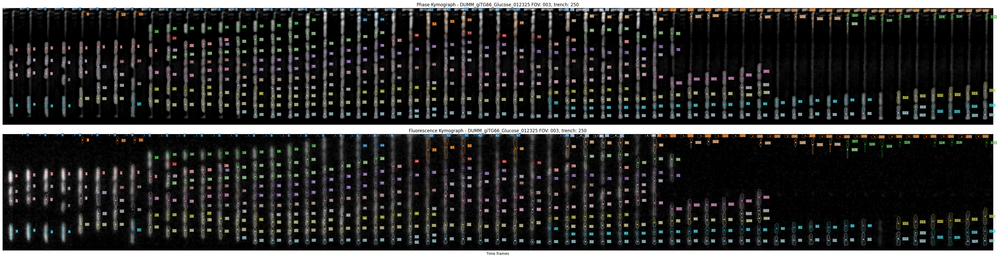

In [141]:
exp_view, fov_view, trench_view, start_t = exp_tuples[0]

df_view = all_cells_pd[(all_cells_pd['experiment_name']==exp_view) &
                       (all_cells_pd['FOV']==fov_view) &
                       (all_cells_pd['trench_id']==trench_view)].copy()


# path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/fast4deg_drift_corrected/rotated/mm_channels/subtracted/{fov_view}_{trench_view}.tif'
# path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}//hyperstacked/drift_corrected/fast4deg_drift_corrected/rotated/mm_channels/subtracted/fluor/{fov_view}_{trench_view}.tif'


# path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/{fov_view}_{trench_view}.tif'
# path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/fluor/{fov_view}_{trench_view}.tif'

path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/kymographs/phase/{fov_view}_{trench_view}.tif'
path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}//kymographs/fluor/{fov_view}_{trench_view}.tif'


phase_kymograph = tifffile.imread(path_to_phase_kymograph)
fluor_kymograph = tifffile.imread(path_to_fluor_kymograph)

plot_kymograph_cells_id(phase_kymograph, fluor_kymograph, 
                                    df_view, 
                                    exp_view, fov_view, trench_view, 
                                    None, 
                                    track_id_col='track_id')

ground_truth_lineage_id_dict_1368 = {
    '22': 'A',
    '32': 'A',
    '56': 'A.1',
    '80': 'A.1',
    '88': 'A.1',
    '95': 'A.1.1',
    '103': 'A.1.1',
    '107': 'A.1.1',
    '96': 'A.1.2',
    '104': 'A.1.2',
    '108': 'A.1.2',
    '57': 'A.2',
    '109': 'A.2.1',
    '123': 'A.2.1',
    '135': 'A.2.1',
    '146': 'A.2.1',
    '154': 'A.2.1',
    '167': 'A.2.1',
    '174': 'A.2.1',
    '175': 'A.2.1',
    '187': 'A.2.1.1',
    '188': 'A.2.1.2',
    
    '110': 'A.2.2',
    '131': 'A.2.2',
    '136': 'A.2.2',
    '147': 'A.2.2.1',
    '155': 'A.2.2.1',
    '168': 'A.2.2.1',
    
    '148': 'A.2.2.2',
    '196': 'A.2.2.2',
}

In [155]:
#"DUMM_giTG66_Glucose_012325 FOV: 003, trench 250"
ground_truth_lineage_id_dict_250 = {'4':'A',
 '10':'A',
 '12':'A.1',
 '17': 'B',
 '21': 'B.1',
 ## ID 21 changes cell to B.1.1
 '21':'B.1.1',
                                    
 '77':'B.1.1.2',
 '82':'B.1.1.2',
 '103':'B.1.1.2.1',
 '104':'B.1.1.2.2',
 '76':'B.1.1.1',
 '101':'B.1.1.1.1',
 '37':'B.1.2',
 '51':'B.1.2',
 #Nora's notes show an x here but not sure why maybe 51 becomes a new base cell?
 '112':'B.1.2',
 '116':'B.1.2.1',
 '117':'B.1.2.2',
 '83':'B.1.2.1',
 '111':'B.1.2.1',
 '20':'B.2',
 '30':'B.2',
 '40':'B.2',
 '41':'B.2.1',
 '45':'B.2.1',
 '57':'B.2.1',
 '61':'B.2.1',
 '64':'B.2.1',
 '72':'B.2.1.1',
 '81':'B.2.1.1',
 #note that 71 is not tracked until now but it should then become what 81 was at a later time point
 '71':'B.2.1.1',
 '73':'B.2.1.2',
 '87':'B.2.1.2',
 '94':'B.2.1.2',
 '42':'B.2.2',
 '46':'B.2.2',
 '58':'B.2.2',
 '65':'B.2.2',
 #change 65 from B.2.2 to a cell that it split into
 '65':'B.2.2.2',
 '87':'B.2.2.1',
 '95':'B.2.2.1',
}

In [156]:
all_cells_pd['track_id'] = pd.to_numeric(all_cells_pd['track_id'], errors='coerce')
all_cells_pd['track_id'] = all_cells_pd['track_id'].fillna(0)
all_cells_pd['track_id'] = all_cells_pd['track_id'].astype('Int64')
all_cells_pd['track_id'] = all_cells_pd['track_id'].astype(str)

In [157]:
all_cells_pd.loc[:, 'ground_truth_lineage'] = None
all_cells_pd.loc[all_cells_pd['trench_id'] ==trench_view, 'ground_truth_lineage']= all_cells_pd.loc[all_cells_pd['trench_id'] ==trench_view,'track_id'].map(ground_truth_lineage_id_dict_250)

In [158]:
all_cells_pd.loc[all_cells_pd['trench_id'] ==trench_view]['ground_truth_lineage'].unique()

array([nan, 'B.2.1.2', 'B.2.1.1', 'B.2.2.1', 'B.1.1.1.1', 'B.2.1',
       'B.2.2.2', 'B.2.2', 'A.1', 'B.1.1.2.1', 'B.1.2.1', 'B.2',
       'B.1.1.1', 'B.1.1.2', 'A', 'B.1.1.2.2', 'B.1.1', 'B', 'B.1.2',
       'B.1.2.2'], dtype=object)

In [159]:
all_cells_pd.to_pickle(all_cells_filename)

In [154]:
 #note that 71 is not tracked until now but it should then become what 81 was at a later time point
 # '71':'B.2.1.1',


all_cells_pd['track_id'][(all_cells_pd['track_id'] == '71') ] = '7100'

/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_12251/491150068.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  all_cells_pd['track_id'][all_cells_pd['track_id'] == '71'] = '7100'
/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr

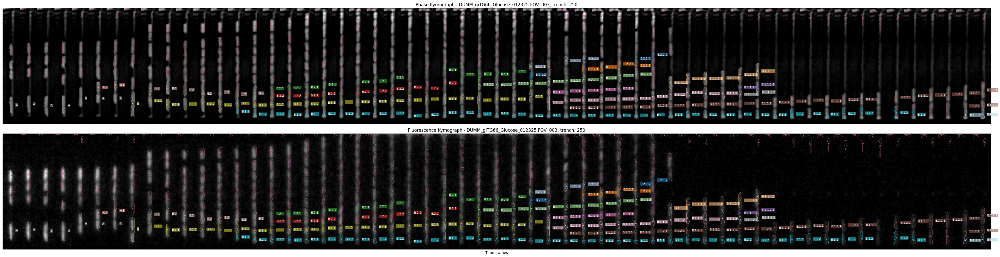

In [162]:
df_view = all_cells_pd[(all_cells_pd['experiment_name']==exp_view) &
                       (all_cells_pd['FOV']==fov_view) &
                       (all_cells_pd['trench_id']==trench_view)].copy()


# path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/fast4deg_drift_corrected/rotated/mm_channels/subtracted/{fov_view}_{trench_view}.tif'
# path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}//hyperstacked/drift_corrected/fast4deg_drift_corrected/rotated/mm_channels/subtracted/fluor/{fov_view}_{trench_view}.tif'


# path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/{fov_view}_{trench_view}.tif'
# path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/fluor/{fov_view}_{trench_view}.tif'


path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/kymographs/phase/{fov_view}_{trench_view}.tif'
path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}//kymographs/fluor/{fov_view}_{trench_view}.tif'



phase_kymograph = tifffile.imread(path_to_phase_kymograph)
fluor_kymograph = tifffile.imread(path_to_fluor_kymograph)

plot_kymograph_cells_id(phase_kymograph, fluor_kymograph, 
                                    df_view, 
                                    exp_view, fov_view, trench_view, 
                                    None, 
                                    track_id_col='ground_truth_lineage')

In [167]:
strain_exp_dict = {# need araB gitg61/CL08 lineage tracing CL008_giTG068_072925 pos 0-10 is CL08 # don't see fluor signal
                  # need alkA gitg63 lineage tracing potentially DUMM_giTG63_giTG67_Glucose_121724_1 pos 5, 'DUMM_giTG068_063_061725' look at pos 1-8, had pos 0 but bad for lineage
                  # need murQ gitg67 lineage tracing potenitally DUMM_giTG068_067_061825 or DUMM_giTG63_giTG67_Glucose_121724_1 pos 6-9

                  'chpS': ['DUMM_giTG62_Glucose_012925'],  #need lineage tracing, Nora working on it
                  'baeS':['DUMM_giTG66_Glucose_012325'],  # need lineage tracing, Adrian working on it
                  'lacZ':['DUMM_giTG059_noKan_Glucose_031125'],
                  'gfcE': ['DUMM_giTG064_Glucose_022625'],
                  'gldA': ['DUMM_giTG69_Glucose_013025'],
                  #'murQ': [' DUMM_giTG63_giTG67_Glucose_121724_1'],
                  'alkA': ['DUMM_giTG068_063_061725_v2','DUMM_giTG63_giTG67_Glucose_121724_1_v2'],
                  'mazF': ['DUMM_giTG059_060_061125'], # constitutive
                  'hupA':['DUMM_giTG068_052925', 'DUMM_giTG068_063_061725'] # constitutive
                  }


In [168]:
from scipy.signal import find_peaks

In [169]:
def find_and_store_peaks(cell_df, threshold):
    peaks_indices, _ = find_peaks(cell_df['intensity_mean_fluor'], height=threshold)
    return cell_df.iloc[peaks_indices]

In [170]:
def plot_growth_analysis(all_cells_pd, time_col, length_col, folder, fov_id, peak_id,
                         prominence=0.3, distance=3, window_size=3):

    """Analyzes and plots cell growth data with exponential fits for detected phases."""

    cell_df = all_cells_pd.copy()

    growth_phases = growth_curves.detect_growth_phases(cell_df, time_col, length_col, prominence, distance, window_size)

    cell_df = cell_df.assign(y_fit=np.nan, residuals=np.nan, r_squared=np.nan, growth_phase=None, growth_rate_constant=np.nan, doubling_time = np.nan)

    plt.figure(figsize=(10, 6))
    growth_curves._plot_raw_data(cell_df, time_col, length_col, None)

    if not growth_phases:
        plt.title("Cell Data (No Growth Phases Detected)")
        print("No growth phases detected.")
    else:
        for i, (start, end) in enumerate(growth_phases):
            cell_df = growth_curves._process_growth_phase(cell_df, i + 1, start, end, time_col, length_col)

        plt.title(f'Cell Growth Analysis {folder} FOV {fov_id} trench {peak_id}')

    plt.xlabel('Time (min)')
    plt.ylabel('Cell Length (pxls)')
    plt.yscale('log')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.show()

    return cell_df

In [171]:
import seaborn as sns

DUMM_giTG62_Glucose_012925


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


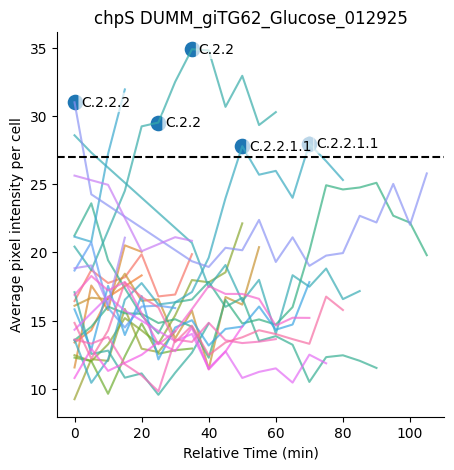

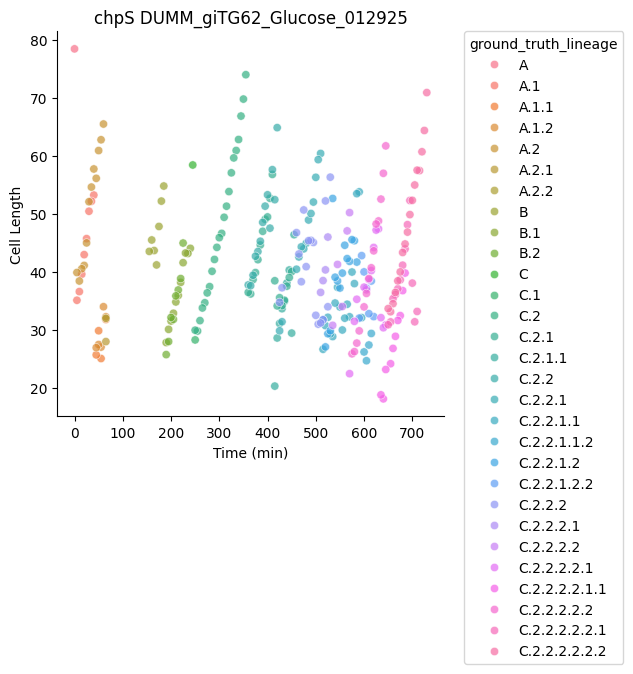

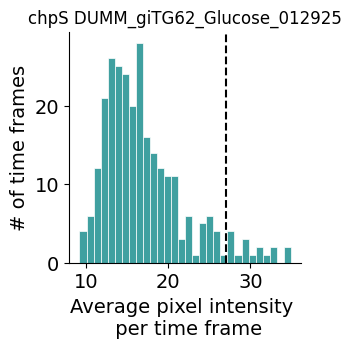

DUMM_giTG66_Glucose_012325


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


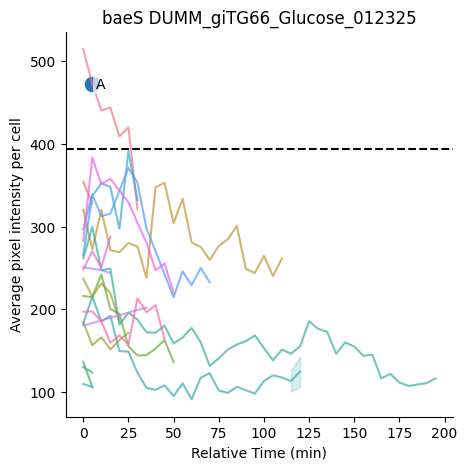

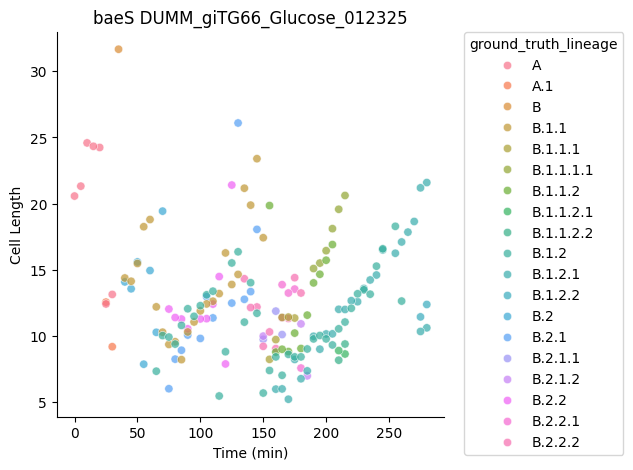

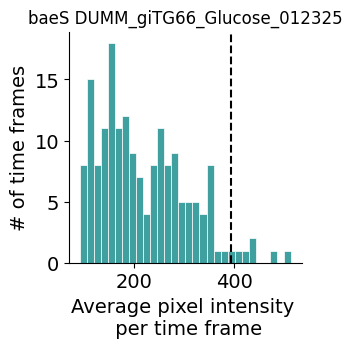

DUMM_giTG059_noKan_Glucose_031125


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


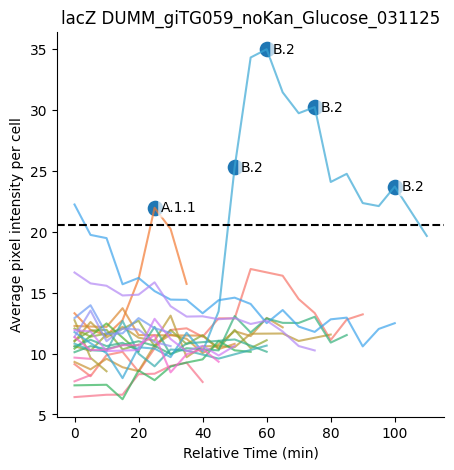

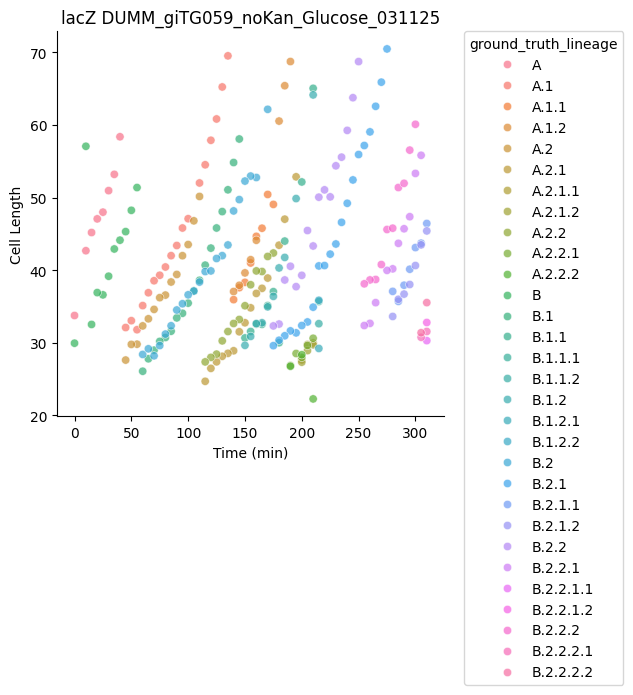

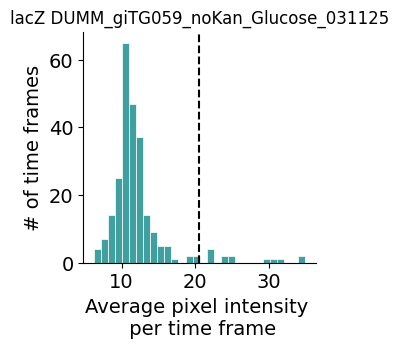

DUMM_giTG064_Glucose_022625


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


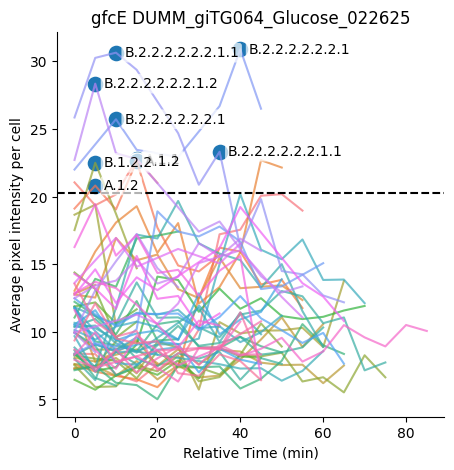

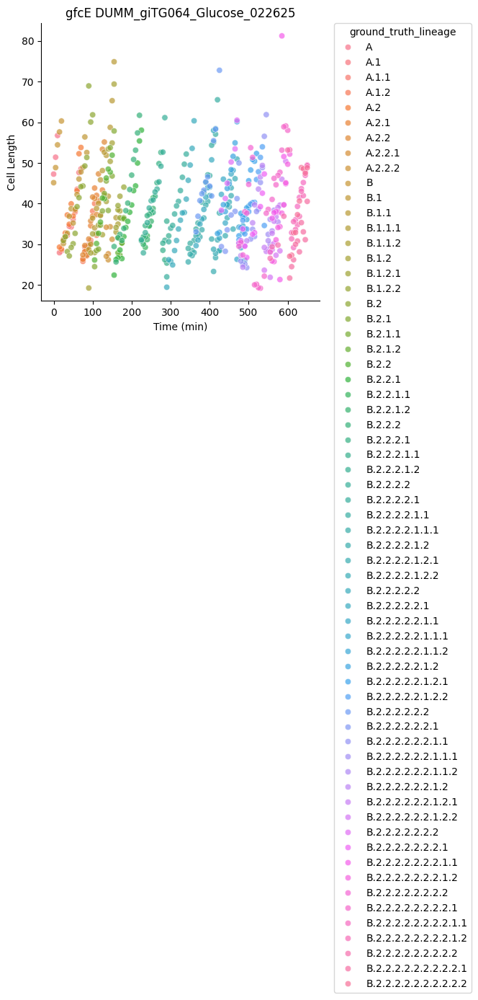

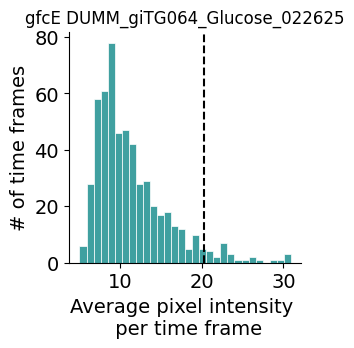

DUMM_giTG69_Glucose_013025


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


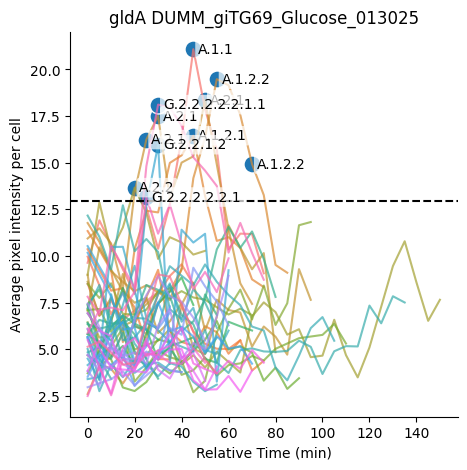

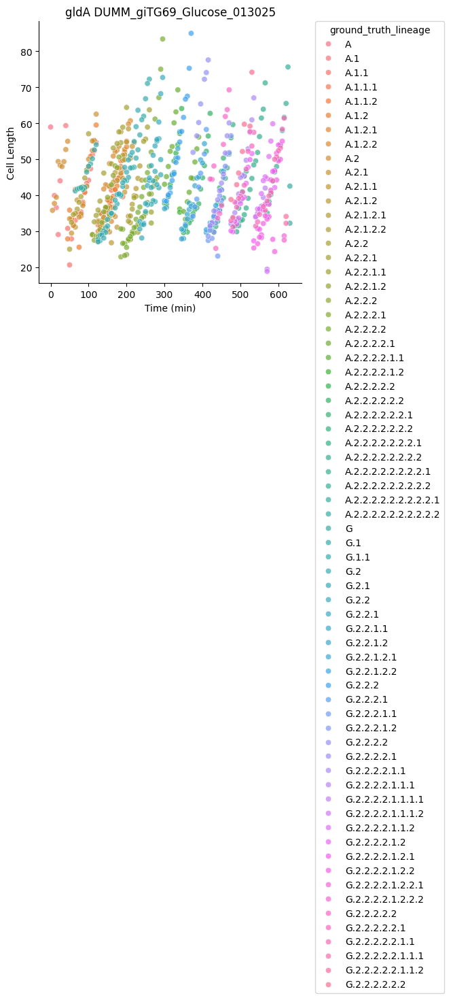

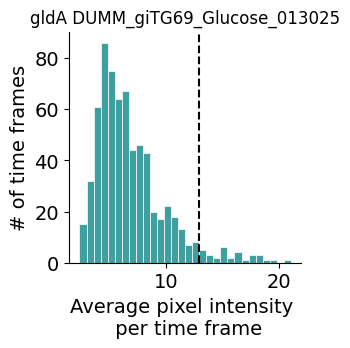

DUMM_giTG068_063_061725_v2


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


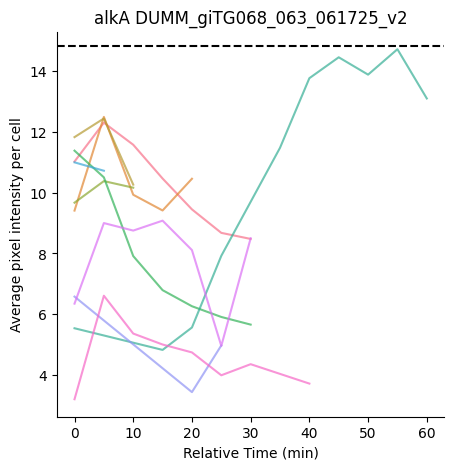

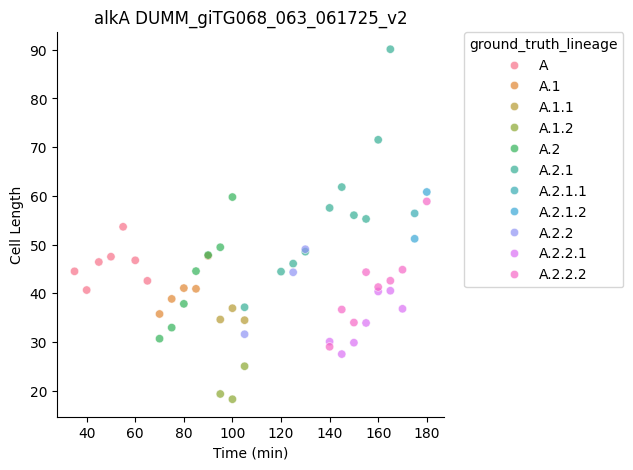

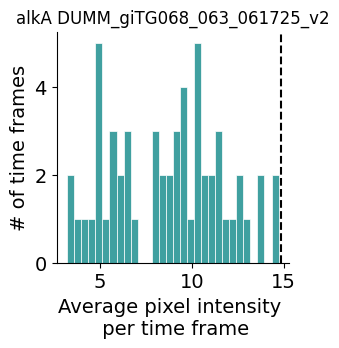

DUMM_giTG63_giTG67_Glucose_121724_1_v2


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


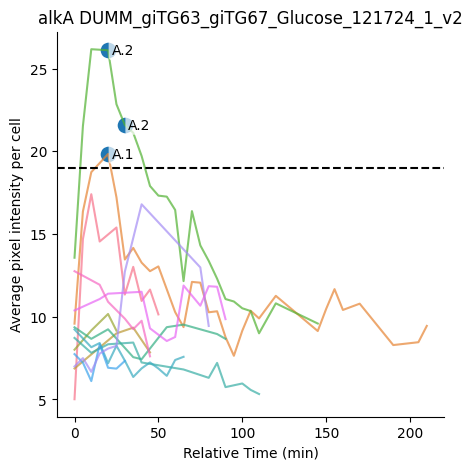

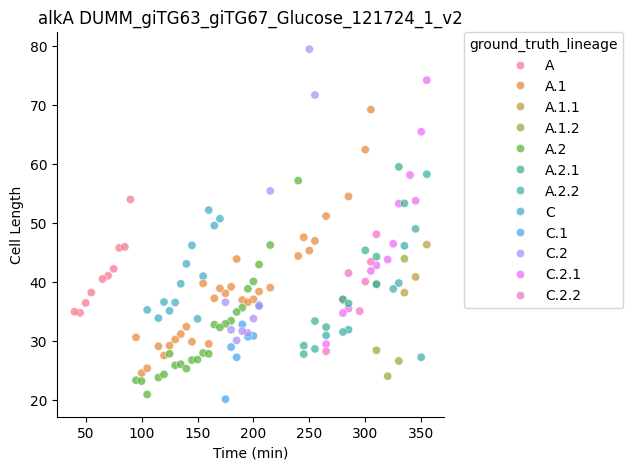

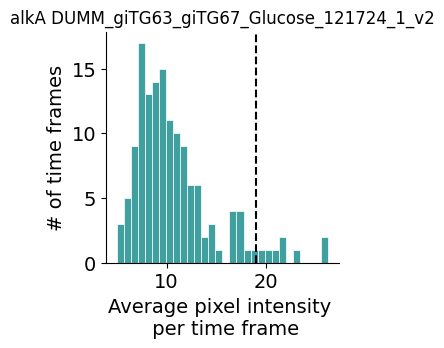

DUMM_giTG059_060_061125


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


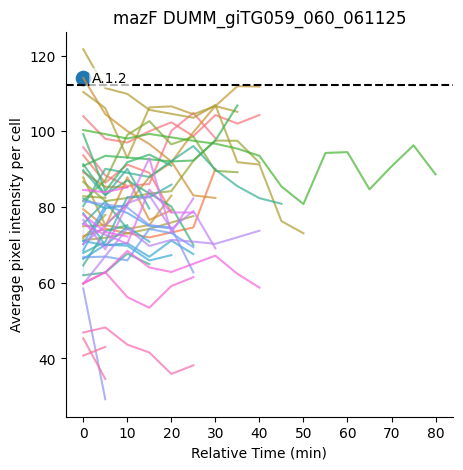

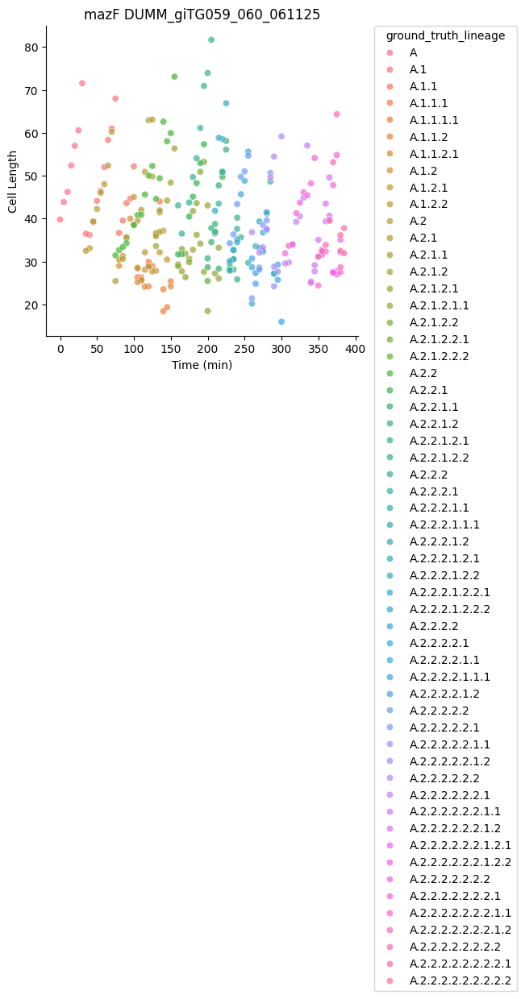

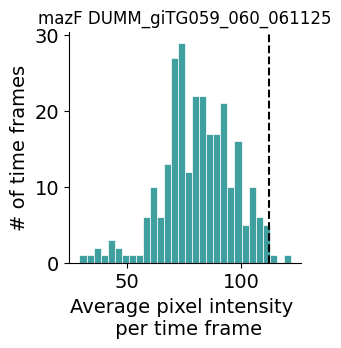

DUMM_giTG068_052925


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


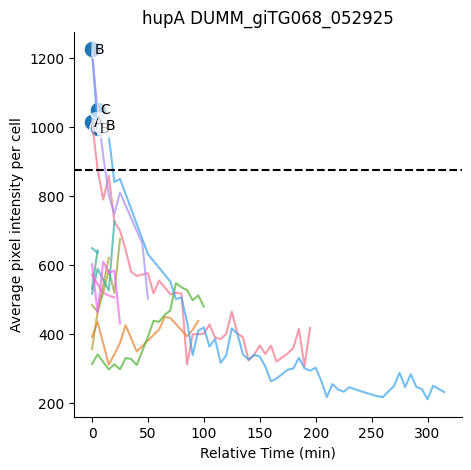

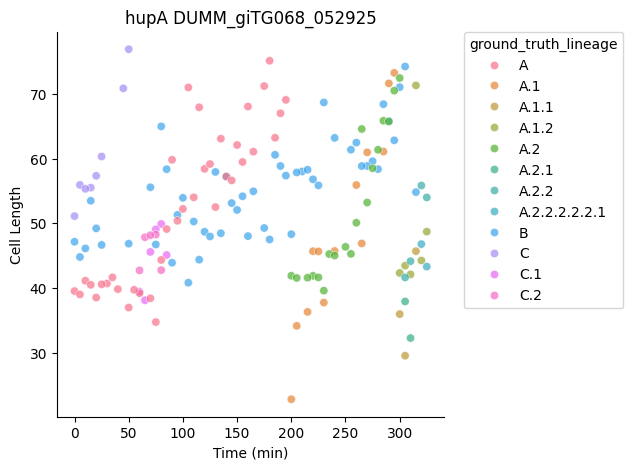

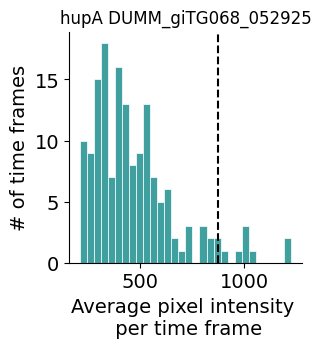

DUMM_giTG068_063_061725


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/2047415706.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)


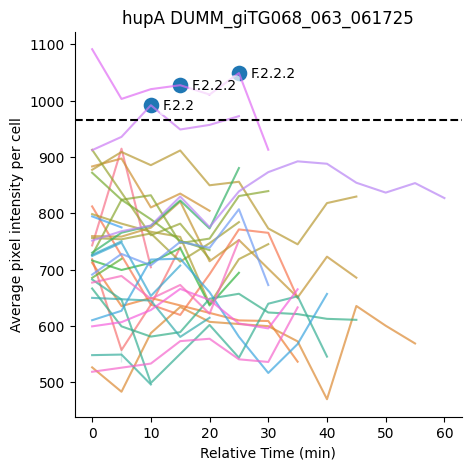

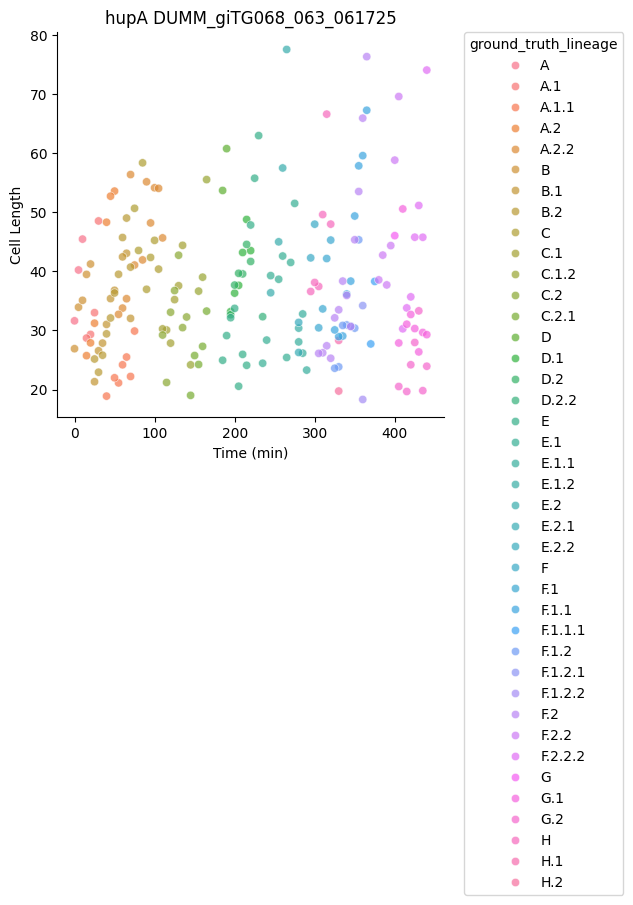

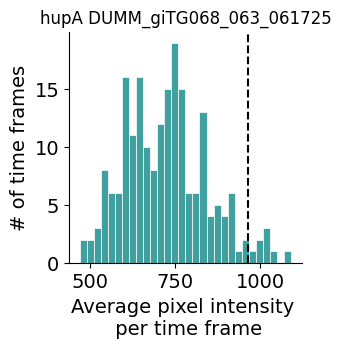

In [420]:
pead_df_all = pd.DataFrame()
for gene, exps in strain_exp_dict.items():
    for exp_view in exps:
        print(exp_view)
        all_cells_filename = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/all_cell_data_{exp_view}.pkl'
        all_cells_pd = pd.read_pickle(all_cells_filename)
        df_analyze = all_cells_pd[(all_cells_pd['experiment_name']==exp_view) &
                               ~all_cells_pd['ground_truth_lineage'].isna()].copy()
        df_analyze['time_min'] = df_analyze['time_frame']*5 

        first_observation_time = df_analyze.groupby('ground_truth_lineage')['time_min'].transform('min')

        # create the relative_time column
        df_analyze['relative_time'] = df_analyze['time_min'] - first_observation_time

        
        global_threshold = df_analyze['intensity_mean_fluor'].mean() + 2 * df_analyze['intensity_mean_fluor'].std()
        
        peaks_df = df_analyze.groupby('ground_truth_lineage').apply(find_and_store_peaks, threshold=global_threshold).reset_index(drop=True)
        if pead_df_all.empty:
            pead_df_all = peaks_df
        else:
            pead_df_all = pd.concat([pead_df_all, peaks_df], ignore_index=True)
        
        plt.figure(figsize=(5, 5))
        hue_order = sorted(df_analyze['ground_truth_lineage'].unique())
        
        sns.lineplot(data=df_analyze, x='relative_time', 
                     y='intensity_mean_fluor', 
                     hue='ground_truth_lineage', 
                     hue_order=hue_order, alpha = 0.7,
                     legend=False)
        
        
        # Plot the detected peaks as a scatter plot
        sns.scatterplot(
            data=peaks_df,
            x='relative_time',
            y='intensity_mean_fluor',
            s=150,  # size of markers
            marker='o',
            legend=False
        )
        
        for _, row in peaks_df.iterrows():
            plt.text(
                row['relative_time'] + 2,
                row['intensity_mean_fluor'],
                row['ground_truth_lineage'],
                fontsize=10,
                ha='left',
                va='center',
                bbox=dict(facecolor='white', alpha=0.7, boxstyle='round,pad=0.2', edgecolor='none')
            )
        
        plt.axhline(y=global_threshold, color='black', linestyle='--', label='Global Threshold')

        plt.title(f'{gene} {exp_view}')
        plt.xlabel('Relative Time (min)')
        plt.ylabel('Average pixel intensity per cell')
        sns.despine();
        plt.show()
        
       
        #plot growth by cell length in real time
        hue_order = sorted(df_analyze['ground_truth_lineage'].unique())
        plt.figure(figsize=(5, 5))
        sns.scatterplot(data=df_analyze, x='time_min', y='axis_major_length',
                        hue='ground_truth_lineage', hue_order=hue_order, alpha = 0.7)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title='ground_truth_lineage')
        plt.title(f'{gene} {exp_view}')
        plt.xlabel('Time (min)')
        plt.ylabel('Cell Length')
        sns.despine();
        plt.show()

        #plot histogram of fluorescence by time frame
        plt.figure(figsize=(3, 3))
        ax = sns.histplot(data=df_analyze, x='intensity_mean_fluor', bins=30, kde=False, color='teal', edgecolor='white')
        plt.axvline(x=global_threshold, color='black', linestyle='--', label='Global Threshold')
        ax.tick_params(axis='x', labelsize=14)
        ax.tick_params(axis='y', labelsize=14)
        plt.title(f'{gene} {exp_view}')
        plt.xlabel('Average pixel intensity \n per time frame', fontsize=14)
        plt.ylabel('# of time frames', fontsize=14)
        sns.despine();
        plt.show()


In [79]:
pead_df_all.columns

Index(['label', 'area', 'coords', 'centroid_y', 'centroid_x',
       'axis_major_length', 'axis_minor_length', 'intensity_mean_phase',
       'intensity_max_phase', 'intensity_min_phase', 'intensity_mean_fluor',
       'intensity_max_fluor', 'intensity_min_fluor', 'time_frame',
       'experiment_name', 'FOV', 'trench_id', 'track_id', 'node_id',
       'ground_truth_lineage', 'time_min', 'relative_time'],
      dtype='object')

In [455]:
import matplotlib.colors as mcolors
colors = [(0, 0, 0), (1, 1, 0)]  # Black -> Yellow
black_to_yellow = mcolors.LinearSegmentedColormap.from_list('black_to_yellow', colors)

def plot_kymograph_cells_interest(phase_kymograph, fluor_kymograph, full_region_df, folder, fov_id, peak_id, fig_dir, track_id_col='track_id', cell_id_to_color=None, highlight_color='red'):
    fig, ax = plt.subplots(2, 1, figsize=(40, 10))

    kymograph_shape = phase_kymograph.shape
    combined_mask = _create_combined_mask(full_region_df, kymograph_shape)
    
    masked_phase_kymograph = phase_kymograph * combined_mask
    masked_fluor_kymograph = fluor_kymograph * combined_mask
    
    ax[0].imshow(masked_phase_kymograph, cmap='grey')
    _plot_cell_masks(ax[0], full_region_df, kymograph_shape, y_coord_col='centroid_y', x_coord_col='centroid_x', lineage_col=track_id_col, cell_id_to_color=cell_id_to_color, highlight_color=highlight_color)
    ax[0].set_yticks([])
    ax[0].set_xticks([])
    ax[0].set_title(f'Phase Kymograph - {folder} FOV: {fov_id}, trench: {peak_id}, cell_id: {cell_id_to_color}')

    ax[1].imshow(masked_fluor_kymograph, cmap= black_to_yellow)
    _plot_cell_masks(ax[1], full_region_df, kymograph_shape, y_coord_col='centroid_y', x_coord_col='centroid_x', lineage_col=track_id_col, cell_id_to_color=cell_id_to_color, highlight_color=highlight_color)
    ax[1].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_title(f'Fluorescence Kymograph - {folder} FOV: {fov_id}, trench: {peak_id}, cell_id: {cell_id_to_color}')

    plt.xlabel("Time frames")
    plt.tight_layout()


def _create_combined_mask(full_region_df, kymograph_shape):
    """
    Creates a single binary mask for the entire kymograph, combining all cell masks.
    """
    combined_mask = np.zeros(kymograph_shape, dtype=bool)
    for _, region_props in full_region_df.iterrows():
        # Check if the 'coords' column exists and is not empty
        if 'coords' in region_props and region_props['coords'] is not None and len(region_props['coords']) > 0:
            cell_pixel_coords = np.array(region_props['coords'])
            rows = cell_pixel_coords[:, 0]
            cols = cell_pixel_coords[:, 1]
            combined_mask[rows, cols] = True
    return combined_mask



def _plot_cell_masks(ax, full_region_df, kymograph_shape, y_coord_col = 'centroid_y', x_coord_col = 'centroid_x', lineage_col = None, cell_id_to_color=None, highlight_color='red'):
    default_cell_contour_color = 'white'
    text_color = 'white'
    text_offset_x = 5
    text_offset_y = 0

    all_contours_segments = []
    all_contour_colors = []
    
    all_text_params = []

    # Case 1: A specific cell is specified, so we'll show an arrow and no contour for it
    if cell_id_to_color is not None:
        for _, region_props in full_region_df.iterrows():
            if not ('coords' in region_props and region_props['coords'] is not None and len(region_props['coords']) > 0):
                continue
            
            cell_pixel_coords = np.array(region_props['coords'])
            is_cell_of_interest = lineage_col and region_props[lineage_col] == cell_id_to_color
            
            y_coord = region_props[y_coord_col]
            x_coord = region_props[x_coord_col]
            
            # Only add arrow and text for the cell of interest
            if is_cell_of_interest:
                top_edge_y = np.min(cell_pixel_coords[:, 0])
                arrow_tip_y = top_edge_y - 2
                arrow_start_y = arrow_tip_y - 15
                arrow_x = x_coord
                
                ax.annotate('', xy=(arrow_x, arrow_tip_y), xytext=(arrow_x, arrow_start_y), 
                            arrowprops=dict(facecolor=highlight_color, edgecolor=highlight_color, shrink=0.05, width=2, headwidth=8, headlength=8))
                
    # Case 2: No specific cell is specified, show colored contours for all cells
    else:
        track_colors = None
        if lineage_col:
            unique_track_ids = full_region_df[lineage_col].dropna().unique()
            colors_cmap = plt.get_cmap('tab20', len(unique_track_ids))
            track_colors = {track_id: colors_cmap(i) for i, track_id in enumerate(unique_track_ids)}

        for _, region_props in full_region_df.iterrows():
            if not ('coords' in region_props and region_props['coords'] is not None and len(region_props['coords']) > 0):
                continue
            
            cell_pixel_coords = np.array(region_props['coords'])
            
            min_row, min_col = np.min(cell_pixel_coords, axis=0)
            max_row, max_col = np.max(cell_pixel_coords, axis=0)
            buffer = 1
            bbox_min_row = max(0, min_row - buffer)
            bbox_min_col = max(0, min_col - buffer)
            bbox_max_row = min(kymograph_shape[0], max_row + buffer)
            bbox_max_col = min(kymograph_shape[1], max_col + buffer)
            temp_mask_shape = (bbox_max_row - bbox_min_row + 1, bbox_max_col - bbox_min_col + 1)
            temp_mask = np.zeros(temp_mask_shape, dtype=np.uint8)
            relative_rows = cell_pixel_coords[:, 0] - bbox_min_row
            relative_cols = cell_pixel_coords[:, 1] - bbox_min_col
            temp_mask[relative_rows, relative_cols] = 1
            contours = find_contours(temp_mask, level=0.5, fully_connected='high')
            if not contours:
                continue
            
            if lineage_col and track_colors and region_props[lineage_col] in track_colors:
                current_color = track_colors[region_props[lineage_col]]
            else:
                current_color = default_cell_contour_color
            
            for contour in contours:
                global_contour_x = contour[:, 1] + bbox_min_col
                global_contour_y = contour[:, 0] + bbox_min_row
                all_contours_segments.append(np.vstack([global_contour_x, global_contour_y]).T)
                all_contour_colors.append(current_color)

    # Plot the collected data after the loop
    if all_contours_segments:
        line_collection = LineCollection(all_contours_segments, colors=all_contour_colors, linewidths=2)
        ax.add_collection(line_collection)
    
    for params in all_text_params:
        ax.text(params['x'], params['y'], params['s'], color=params['color'],
                fontsize=params['fontsize'], ha=params['ha'], va=params['va'],
                bbox=params['bbox'])

In [157]:
def get_parent(cell_id, df_series):
    """Returns the parent cell_id from the DataFrame for a given cell_id."""
    if '.' not in cell_id:
        return None
    parent_id = cell_id.rsplit('.', 1)[0]
    if parent_id in df_series.values:
        return parent_id
    return None

def get_daughters(cell_id, df_series):
    """Returns a list of daughter cell_ids from the DataFrame for a given cell_id."""
    daughter_ids = [f"{cell_id}.1", f"{cell_id}.2"]
    
    # Filter the DataFrame to find matching daughter IDs
    found_daughters = df_series[df_series.isin(daughter_ids)].tolist()
    return found_daughters

/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/4234988162.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 1, figsize=(40, 10))


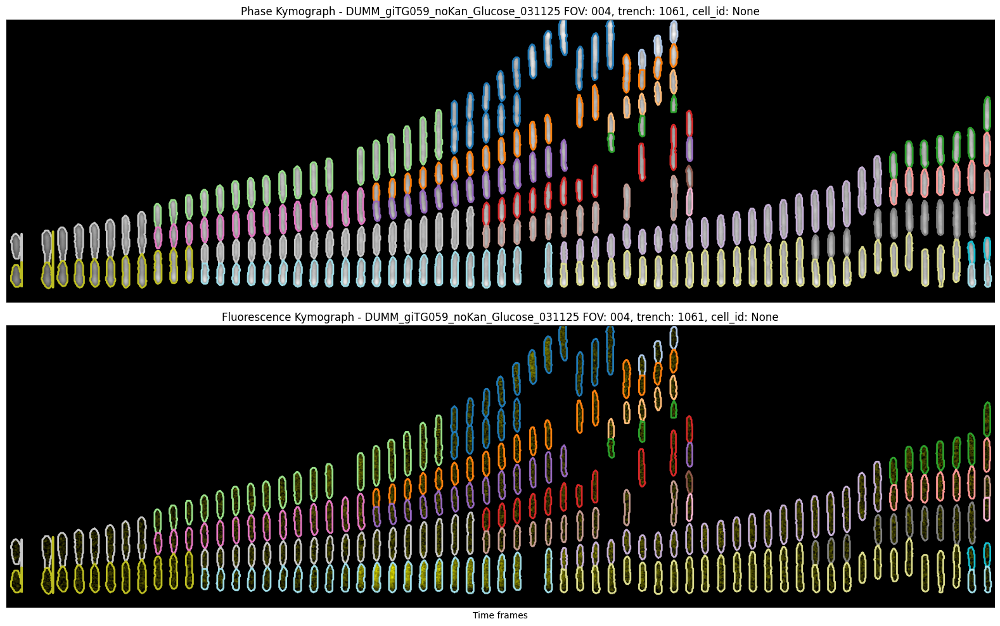

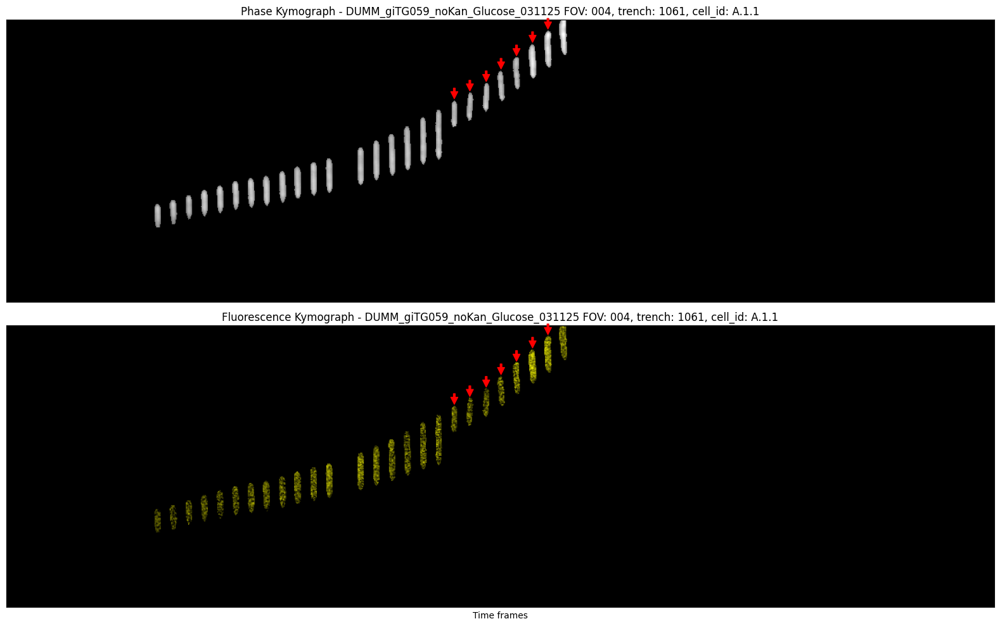

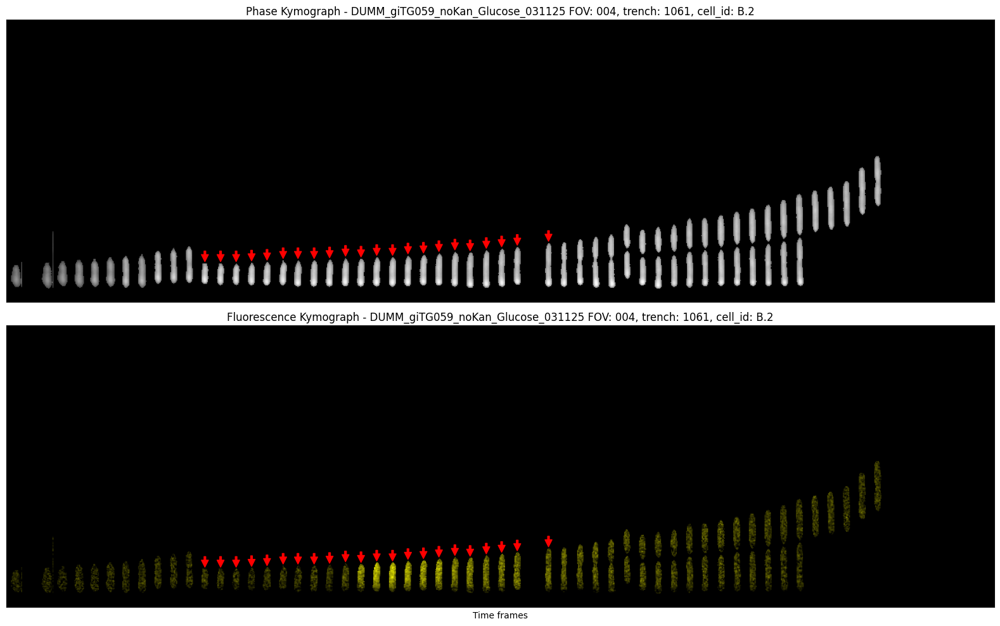

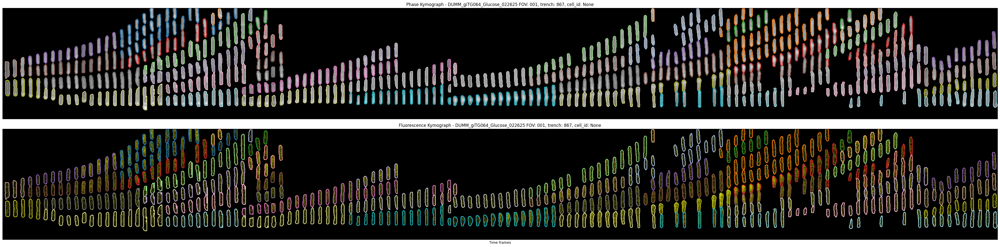

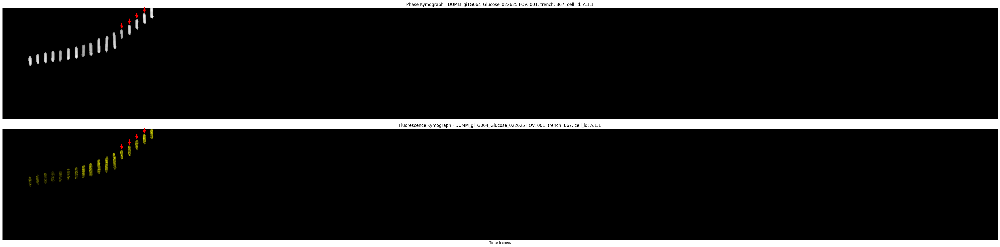

...

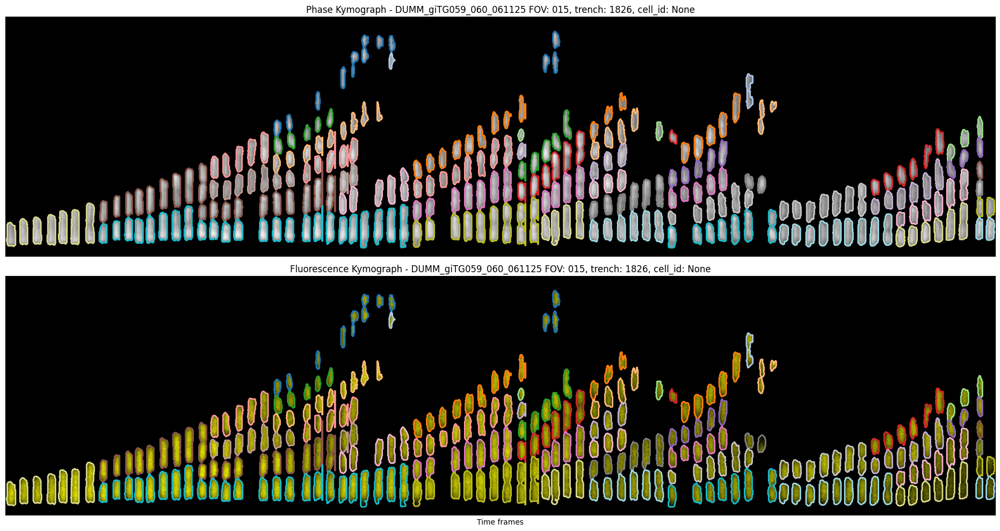

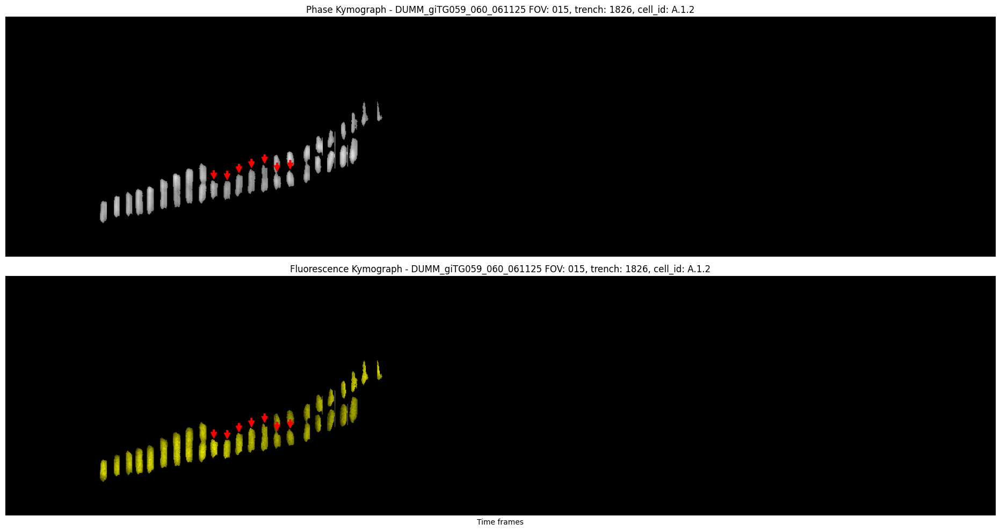

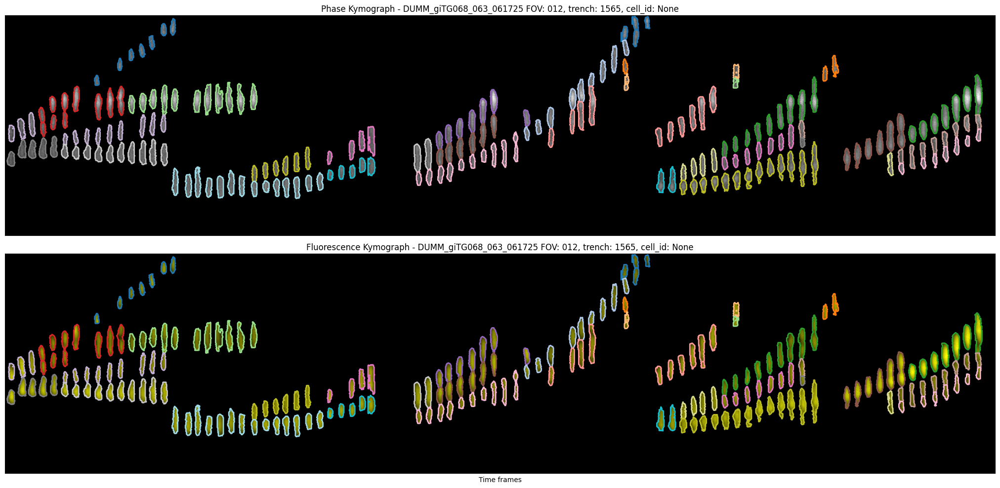

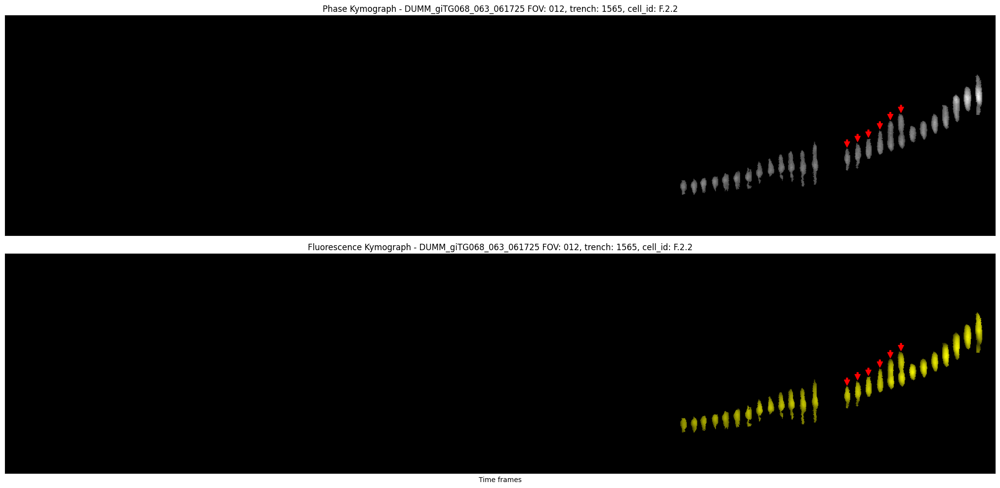

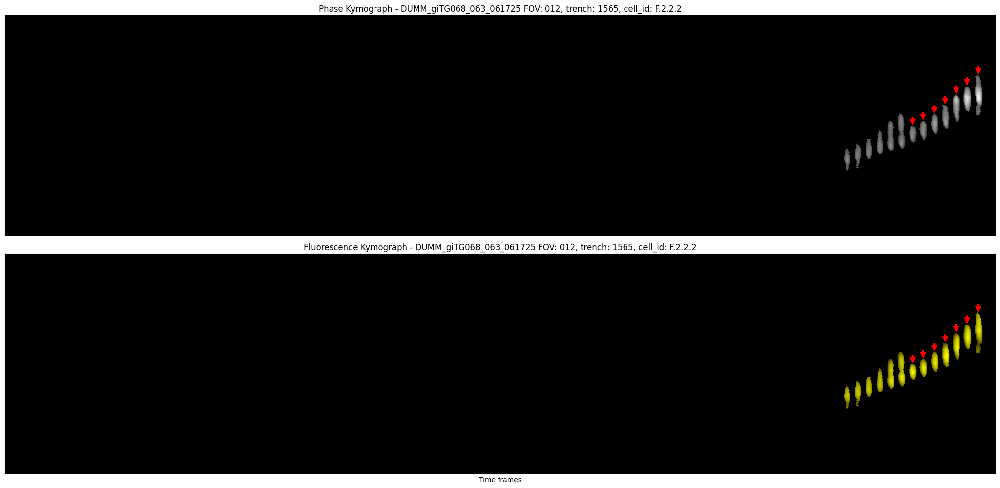

In [456]:
for gene, exps in strain_exp_dict.items():
    for exp_view in exps:
        all_cells_filename = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/all_cell_data_{exp_view}.pkl'
        all_cells_pd = pd.read_pickle(all_cells_filename)
        exp_tuples = lineage.identify_exp_fov(all_cells_pd)
        
        for track in exp_tuples:
            exp_view, fov_view, trench_view, start_t = track
            
            cells_to_view = pead_df_all['ground_truth_lineage'][(pead_df_all['experiment_name']==exp_view) &
                       (pead_df_all['FOV']==fov_view) &
                       (pead_df_all['trench_id']==trench_view)].unique()
            if len(cells_to_view) > 0:
                # path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/fast4deg_drift_corrected/rotated/mm_channels/subtracted/{fov_view}_{trench_view}.tif'
                # path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}//hyperstacked/drift_corrected/fast4deg_drift_corrected/rotated/mm_channels/subtracted/fluor/{fov_view}_{trench_view}.tif'
                
                
                path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/{fov_view}_{trench_view}.tif'
                path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/fluor/{fov_view}_{trench_view}.tif'
            
                # path_to_phase_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}/kymographs/phase/{fov_view}_{trench_view}.tif'
                # path_to_fluor_kymograph = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{exp_view}//kymographs/fluor/{fov_view}_{trench_view}.tif'
            
                # Check if both Tiff files exist before reading them and proceeding
                if os.path.exists(path_to_phase_kymograph) and os.path.exists(path_to_fluor_kymograph):
                    phase_kymograph = tifffile.imread(path_to_phase_kymograph)
                    fluor_kymograph = tifffile.imread(path_to_fluor_kymograph)
    
    
                    all_cells_to_view_df = all_cells_pd[(all_cells_pd['experiment_name']==exp_view) &
                           (all_cells_pd['FOV']==fov_view) &
                           (all_cells_pd['trench_id']==trench_view) &
                           ~all_cells_pd['ground_truth_lineage'].isna()].copy()
                    plot_kymograph_cells_interest(phase_kymograph, fluor_kymograph, 
                                                        all_cells_to_view_df, 
                                                        exp_view, fov_view, trench_view, 
                                                        None, 
                                                        track_id_col='ground_truth_lineage')
    
                    for cell_id in cells_to_view:
                        parent_id = get_parent(cell_id, all_cells_pd['ground_truth_lineage'])
                        daughter_ids = get_daughters(cell_id, all_cells_pd['ground_truth_lineage'])
                        
                    
                        cells_to_view_df = all_cells_pd[(all_cells_pd['experiment_name']==exp_view) &
                               (all_cells_pd['FOV']==fov_view) &
                               (all_cells_pd['trench_id']==trench_view) &
                               all_cells_pd['ground_truth_lineage'].isin([cell_id]) |
                               (all_cells_pd['ground_truth_lineage'].isin([parent_id]) |
                               all_cells_pd['ground_truth_lineage'].isin(daughter_ids)) &
                               ~all_cells_pd['ground_truth_lineage'].isna()].copy()
                                            
                        plot_kymograph_cells_interest(phase_kymograph, fluor_kymograph, 
                                                            cells_to_view_df, 
                                                            exp_view, fov_view, trench_view, 
                                                            None, 
                                                            track_id_col='ground_truth_lineage', 
                                                      cell_id_to_color=cell_id, highlight_color='red')
                

In [196]:
all_subgen_cell_data = pd.DataFrame()
for gene, exps in strain_exp_dict.items():
    for exp_view in exps:
        all_cells_filename = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/all_cell_data_{exp_view}.pkl'
        all_cells_pd = pd.read_pickle(all_cells_filename)
        all_cells_pd['gene'] = gene
        if all_subgen_cell_data.empty:
            all_subgen_cell_data = all_cells_pd
        else:
            all_subgen_cell_data = pd.concat([all_subgen_cell_data,all_cells_pd], ignore_index=True)

In [197]:
all_lineages_df = all_subgen_cell_data[~all_subgen_cell_data['ground_truth_lineage'].isna()].copy()

In [198]:
len(all_lineages_df)

2744

In [199]:
all_lineages_df.columns

Index(['label', 'area', 'coords', 'centroid_y', 'centroid_x',
       'axis_major_length', 'axis_minor_length', 'intensity_mean_phase',
       'intensity_max_phase', 'intensity_min_phase', 'intensity_mean_fluor',
       'intensity_max_fluor', 'intensity_min_fluor', 'time_frame',
       'experiment_name', 'FOV', 'trench_id', 'track_id', 'node_id',
       'ground_truth_lineage', 'gene'],
      dtype='object')

In [200]:
pead_df_all.columns

Index(['label', 'area', 'coords', 'centroid_y', 'centroid_x',
       'axis_major_length', 'axis_minor_length', 'intensity_mean_phase',
       'intensity_max_phase', 'intensity_min_phase', 'intensity_mean_fluor',
       'intensity_max_fluor', 'intensity_min_fluor', 'time_frame',
       'experiment_name', 'FOV', 'trench_id', 'track_id', 'node_id',
       'ground_truth_lineage', 'time_min', 'relative_time'],
      dtype='object')

In [201]:
all_lineages_peaks_df = pd.merge(all_lineages_df, pead_df_all, on=['label', 'experiment_name', 'FOV', 'trench_id'], how='left')

In [202]:
all_lineages_peaks_df['peaked'] = all_lineages_peaks_df['time_min'].notna()

In [203]:
all_lineages_peaks_df.columns

Index(['label', 'area_x', 'coords_x', 'centroid_y_x', 'centroid_x_x',
       'axis_major_length_x', 'axis_minor_length_x', 'intensity_mean_phase_x',
       'intensity_max_phase_x', 'intensity_min_phase_x',
       'intensity_mean_fluor_x', 'intensity_max_fluor_x',
       'intensity_min_fluor_x', 'time_frame_x', 'experiment_name', 'FOV',
       'trench_id', 'track_id_x', 'node_id_x', 'ground_truth_lineage_x',
       'gene', 'area_y', 'coords_y', 'centroid_y_y', 'centroid_x_y',
       'axis_major_length_y', 'axis_minor_length_y', 'intensity_mean_phase_y',
       'intensity_max_phase_y', 'intensity_min_phase_y',
       'intensity_mean_fluor_y', 'intensity_max_fluor_y',
       'intensity_min_fluor_y', 'time_frame_y', 'track_id_y', 'node_id_y',
       'ground_truth_lineage_y', 'time_min', 'relative_time', 'peaked'],
      dtype='object')

In [204]:
all_lineages_peaks_df_f = all_lineages_peaks_df[['gene','label', 'area_x', 'coords_x', 'centroid_y_x', 'centroid_x_x',
       'axis_major_length_x', 'axis_minor_length_x', 'intensity_mean_phase_x',
       'intensity_max_phase_x', 'intensity_min_phase_x',
       'intensity_mean_fluor_x', 'intensity_max_fluor_x',
       'intensity_min_fluor_x', 'time_frame_x', 'experiment_name', 'FOV',
       'trench_id', 'track_id_x', 'node_id_x', 'ground_truth_lineage_x', 'peaked']]

In [ ]:
strain_exp_dict = {# need araB gitg61/CL08 lineage tracing CL008_giTG068_072925 pos 0-10 is CL08 # don't see fluor signal
                  # need alkA gitg63 lineage tracing potentially DUMM_giTG63_giTG67_Glucose_121724_1 pos 5, 'DUMM_giTG068_063_061725' look at pos 1-8, had pos 0 but bad for lineage
                  # need murQ gitg67 lineage tracing potenitally DUMM_giTG068_067_061825 or DUMM_giTG63_giTG67_Glucose_121724_1 pos 6-9

                  'chpS': ['DUMM_giTG62_Glucose_012925'],  #need lineage tracing, Nora working on it
                  'baeS':['DUMM_giTG66_Glucose_012325'],  # need lineage tracing, Adrian working on it
                  'lacZ':['DUMM_giTG059_noKan_Glucose_031125'],
                  'gfcE': ['DUMM_giTG064_Glucose_022625'],
                  'gldA': ['DUMM_giTG69_Glucose_013025'],
                  #'murQ': [' DUMM_giTG63_giTG67_Glucose_121724_1'],
                  'alkA': ['DUMM_giTG068_063_061725_v2','DUMM_giTG63_giTG67_Glucose_121724_1_v2'],
                  'mazF': ['DUMM_giTG059_060_061125'], # constitutive
                  'hupA':['DUMM_giTG068_052925', 'DUMM_giTG068_063_061725'] # constitutive
                  }

In [425]:
df = all_lineages_peaks_df_f.copy()
exp_view = 'DUMM_giTG059_noKan_Glucose_031125'
df_analyze = df[(df['experiment_name']==exp_view) &
                    ~df['ground_truth_lineage_x'].isna()].copy()
df_analyze['time_min'] = df_analyze['time_frame_x']*5 

first_observation_time = df_analyze.groupby('ground_truth_lineage_x')['time_min'].transform('min')

# create the relative_time column
df_analyze['relative_time'] = df_analyze['time_min'] - first_observation_time

In [430]:
highlighted_cell_id = df_analyze[df_analyze['peaked'] == True]['ground_truth_lineage_x'].iloc[0]

In [432]:
highlighted_cell_id

'A.1.1'

In [434]:
df_analyze[df_analyze['peaked'] == True]['ground_truth_lineage_x'].unique()

array(['A.1.1', 'B.2'], dtype=object)

/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/3481126190.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', len(df_analyze['ground_truth_lineage_x'].unique()))


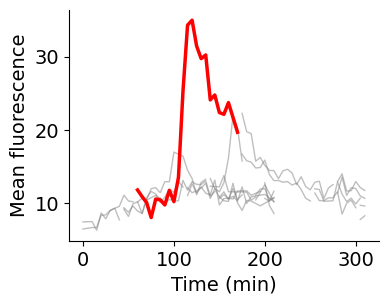

In [453]:
cmap = plt.cm.get_cmap('viridis', len(df_analyze['ground_truth_lineage_x'].unique()))
plt.figure(figsize=(4, 3))

for cell_id in df_analyze['ground_truth_lineage_x'].unique():
    subset = df_analyze[df_analyze['ground_truth_lineage_x'] == cell_id].sort_values(by='time_min')
    plt.plot(subset['time_min'], subset['intensity_mean_fluor_x'], color='gray', alpha=0.5, linewidth=1)

# Plot the specific line to be colored
highlighted_cell_ids = df_analyze[df_analyze['peaked'] == True]['ground_truth_lineage_x'].unique()

cell_id_color = 'B.2'
colored_cell = df_analyze[df_analyze['ground_truth_lineage_x'] == cell_id_color ].sort_values(by='time_min')
plt.plot(colored_cell['time_min'], colored_cell['intensity_mean_fluor_x'], linewidth=2.5, color='red', label=cell_id)
sns.despine();
plt.xlabel('Time (min)', fontsize=14)
plt.ylabel('Mean fluorescence', fontsize=14)
plt.tick_params(axis='x', labelsize=14)
plt.tick_params(axis='y', labelsize=14)

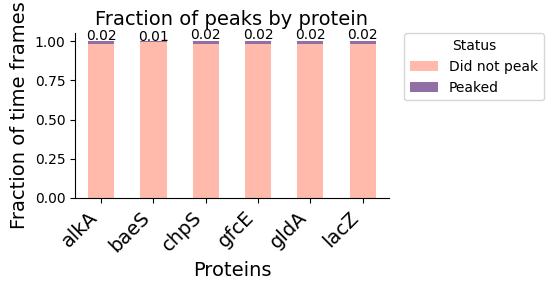

In [232]:
#Calculate the counts for each gene and peaking status
subgen_gene_lineage_peaks = all_lineages_peaks_df_f[~all_lineages_peaks_df_f['gene'].isin(['mazF', 'hupA'])].copy()
gene_peaking_counts = subgen_gene_lineage_peaks.groupby(['gene', 'peaked']).size().unstack(fill_value=0)

# Normalize the counts to get the fraction out of the total for each gene
gene_peaking_fraction = gene_peaking_counts.div(gene_peaking_counts.sum(axis=1), axis=0)

# Rename columns for better legend labels
gene_peaking_fraction.columns = ['Did not peak', 'Peaked']

# Plot the normalized stacked bar graph
ax = gene_peaking_fraction.plot(kind='bar', stacked=True, figsize=(4, 3), color = ['#ffbaac', '#906fa5'])
ax.set_title('Fraction of peaks by protein', fontsize=14)
ax.set_xlabel('Proteins', fontsize=14)
ax.set_ylabel('Fraction of time frames', fontsize=14)
ax.set_xticklabels(gene_peaking_fraction.index, rotation=45, ha='right')
ax.tick_params(axis='x', labelsize=14)
for i, gene in enumerate(gene_peaking_fraction.index):
    peaked_fraction = gene_peaking_fraction.loc[gene, 'Peaked']
    did_not_peak_fraction = gene_peaking_fraction.loc[gene, 'Did not peak']
    
    # Calculate the y-position for the text label
    text_y_position = peaked_fraction + 1.02
    
    # Format the text to two decimal places
    text_label = f'{peaked_fraction:.2f}'
    
    # Add the text to the plot
    ax.text(i, text_y_position, text_label, ha='center', va='center', color='black', fontsize=10)

plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title='Status')
sns.despine();
plt.show()



In [237]:
cell_gene_peak_status

ground_truth_lineage_x  gene
A                       alkA    False
                        baeS     True
                        chpS    False
                        gfcE    False
                        gldA    False
                                ...  
G.2.2.2.2.2.1           gldA     True
G.2.2.2.2.2.1.1         gldA     True
G.2.2.2.2.2.1.1.1       gldA    False
G.2.2.2.2.2.1.1.2       gldA    False
G.2.2.2.2.2.2           gldA    False
Name: peaked, Length: 224, dtype: bool

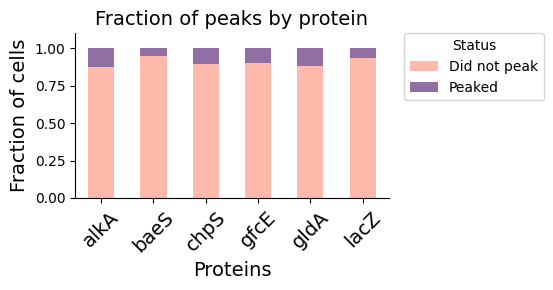

In [242]:
#Calculate the counts for each gene and peaking status
subgen_gene_lineage_peaks = all_lineages_peaks_df_f[~all_lineages_peaks_df_f['gene'].isin(['mazF', 'hupA'])].copy()
cell_gene_peak_status = subgen_gene_lineage_peaks.groupby(['ground_truth_lineage_x', 'gene'])['peaked'].any()

peaking_counts = cell_gene_peak_status.groupby('gene').value_counts()

# Reindex the Series to ensure both True and False values exist for all genes
# This is crucial for plotting a stacked bar chart where some genes might have no 'False' values
peaking_counts = peaking_counts.unstack(fill_value=0).stack()

# Reshape the data for plotting a stacked bar chart
peaking_counts = peaking_counts.unstack()

# Normalize the counts to get the fractions
peaking_fractions = peaking_counts.div(peaking_counts.sum(axis=1), axis=0)
peaking_fractions.columns = ['Did not peak', 'Peaked']

# Plot the stacked bar graph
ax = peaking_fractions.plot(kind='bar', stacked=True, figsize=(4, 3), rot=45, color = ['#ffbaac', '#906fa5'])
ax.set_title('Fraction of peaks by protein', fontsize=14)
ax.set_xlabel('Proteins', fontsize=14)
ax.set_ylabel('Fraction of cells', fontsize=14)
ax.tick_params(axis='x', labelsize=14)
plt.ylim(0, 1.1)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title='Status')
sns.despine();
plt.show()

In [274]:
peak_counts_per_cell

,ground_truth_lineage_x,gene,peak_count
0,A,baeS,1
1,A.1,alkA,1
2,A.1.1,gfcE,1
3,A.1.1,gldA,1
4,A.1.1,lacZ,1
5,A.1.2,gfcE,2
6,A.1.2.1,gldA,1
7,A.1.2.2,gldA,2
8,A.2,alkA,2
9,A.2.1,gldA,3


In [275]:
peak_frequency_per_gene

peak_count,1,2,3,4
gene,,,,
alkA,1,1,0,0
baeS,1,0,0,0
chpS,1,2,0,0
gfcE,3,3,0,0
gldA,6,1,1,0
lacZ,1,0,0,1


In [374]:
peak_counts_per_cell

,ground_truth_lineage_x,gene,peak_count
0,A,baeS,1
1,A.1,alkA,1
2,A.1.1,gfcE,1
3,A.1.1,gldA,1
4,A.1.1,lacZ,1
5,A.1.2,gfcE,2
6,A.1.2.1,gldA,1
7,A.1.2.2,gldA,2
8,A.2,alkA,2
9,A.2.1,gldA,3


In [375]:
peak_frequency_per_gene

peak_count,1,2,3,4
gene,,,,
alkA,1,1,0,0
baeS,1,0,0,0
chpS,1,2,0,0
gfcE,3,3,0,0
gldA,6,1,1,0
lacZ,1,0,0,1


In [381]:
peak_counts_per_cell

,ground_truth_lineage_x,gene,peak_count
0,A,baeS,1
1,A.1,alkA,1
2,A.1.1,gfcE,1
3,A.1.1,gldA,1
4,A.1.1,lacZ,1
5,A.1.2,gfcE,2
6,A.1.2.1,gldA,1
7,A.1.2.2,gldA,2
8,A.2,alkA,2
9,A.2.1,gldA,3


In [411]:
peak_counts_per_cell

,ground_truth_lineage_x,gene,peak_count
0,A,baeS,1
1,A.1,alkA,1
2,A.1.1,gfcE,1
3,A.1.1,gldA,1
4,A.1.1,lacZ,1
5,A.1.2,gfcE,2
6,A.1.2.1,gldA,1
7,A.1.2.2,gldA,2
8,A.2,alkA,2
9,A.2.1,gldA,3


In [413]:
sorted(peak_counts_per_cell['gene'].unique())

['alkA', 'baeS', 'chpS', 'gfcE', 'gldA', 'lacZ']

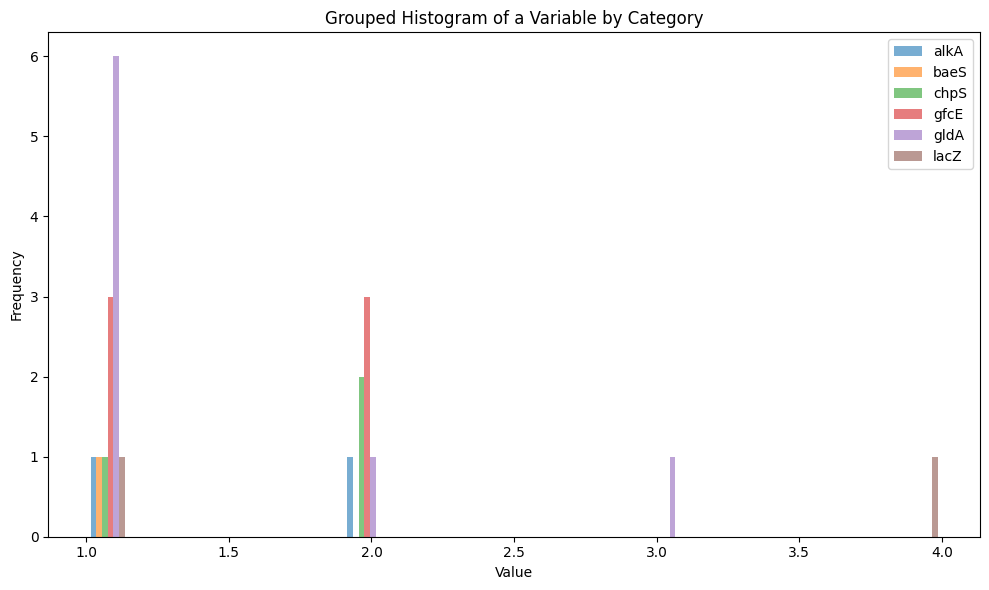

In [414]:
# Group by cell_id and count the number of peaks per cell
subgen_gene_lineage_peaks = all_lineages_peaks_df_f[~all_lineages_peaks_df_f['gene'].isin(['mazF', 'hupA'])].copy()

peaked_df = subgen_gene_lineage_peaks[subgen_gene_lineage_peaks['peaked']]

cell_gene_peak_status = subgen_gene_lineage_peaks.groupby(['ground_truth_lineage_x', 'gene'])['peaked'].any()
peak_counts_per_cell = peaked_df.groupby(['ground_truth_lineage_x', 'gene']).size().reset_index(name='peak_count')


# Separate the values by category
df = peak_counts_per_cell.copy()
data_a = df[df['gene'] == 'alkA']['peak_count']
data_b = df[df['gene'] == 'baeS']['peak_count']
data_c = df[df['gene'] == 'chpS']['peak_count']
data_d = df[df['gene'] == 'gfcE']['peak_count']
data_e = df[df['gene'] == 'gldA']['peak_count']
data_f = df[df['gene'] == 'lacZ']['peak_count']

# Create the grouped histogram
plt.figure(figsize=(10, 6))
plt.hist(
    [data_a, data_b, data_c, data_d, data_e, data_f],
    bins=20,
    label=['alkA', 'baeS', 'chpS', 'gfcE', 'gldA', 'lacZ'],
    alpha=0.6
)

# Add labels and a title
plt.title('Grouped Histogram of a Variable by Category')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()
plt.show()

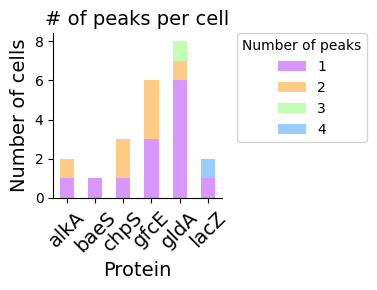

In [383]:
# Group by cell_id and count the number of peaks per cell
subgen_gene_lineage_peaks = all_lineages_peaks_df_f[~all_lineages_peaks_df_f['gene'].isin(['mazF', 'hupA'])].copy()

peaked_df = subgen_gene_lineage_peaks[subgen_gene_lineage_peaks['peaked']]

cell_gene_peak_status = subgen_gene_lineage_peaks.groupby(['ground_truth_lineage_x', 'gene'])['peaked'].any()
peak_counts_per_cell = peaked_df.groupby(['ground_truth_lineage_x', 'gene']).size().reset_index(name='peak_count')


peak_frequency_per_gene = peak_counts_per_cell.pivot_table(
    index='gene',
    columns='peak_count',
    aggfunc='size',
    fill_value=0
)


# Plot the data as a stacked bar chart
fig, ax = plt.subplots(figsize=(4, 3))
peak_frequency_per_gene.plot(
    kind='bar',
    stacked=True,
    color = ['#d896ff', '#ffcb85', '#c2ffb4', '#99ccff'],
    ax=ax
)

# Set labels and title
ax.set_title('# of peaks per cell', fontsize=14)
ax.set_xlabel('Protein', fontsize=14)
ax.set_ylabel('Number of cells', fontsize=14)
ax.set_xticklabels(peak_frequency_per_gene.index, rotation=45)
ax.legend(title='Number of Peaks')
ax.tick_params(axis='x', labelsize=14)
plt.legend(bbox_to_anchor=(1.09, 1), loc='upper left', borderaxespad=0, title='Number of peaks')
sns.despine();
plt.tight_layout()

In [301]:
peaked_df = subgen_gene_lineage_peaks[subgen_gene_lineage_peaks['peaked']]
peak_by_cell = peaked_df.groupby(['ground_truth_lineage_x', 'gene', 'experiment_name']).size().reset_index()
peak_by_cell = peak_by_cell.rename(columns={0: 'peak_count'})

In [313]:
# Find all potential daughter cells, keeping track of their gene and experiment
all_daughter_info = []
for index, row in peaking_parent_combinations.iterrows():
    parent_cell_id = row['ground_truth_lineage_x']
    parent_gene = row['gene']
    parent_exp = row['experiment_name']

    # Find the daughters using the adapted function logic
    # Filter the DataFrame to find daughters within the same gene and experiment
    daughter_series = subgen_gene_lineage_peaks[
        (subgen_gene_lineage_peaks['gene'] == parent_gene) &
        (subgen_gene_lineage_peaks['experiment_name'] == parent_exp)
    ]['ground_truth_lineage_x']
    
    daughters = get_daughters(parent_cell_id, daughter_series)
    
    # Store the daughter info with its parent's context
    for daughter_id in daughters:
        all_daughter_info.append({
            'parent_id': parent_cell_id,
            'parent_gene': parent_gene,
            'parent_exp': parent_exp,
            'daughter_id': daughter_id,
        })

daughter_df = pd.DataFrame(all_daughter_info)
daughter_df = daughter_df.drop_duplicates() 

In [321]:
peaked_daughter = pd.merge(
    daughter_df,
    peak_by_cell,
    left_on=['daughter_id', 'parent_gene', 'parent_exp'],
    right_on=['ground_truth_lineage_x', 'gene', 'experiment_name']
)

In [326]:
peaked_daughter

,parent_id,daughter_id,gene,experiment_name,peak_count
0,B.2.2.2.2.2.2.1,B.2.2.2.2.2.2.1.1,gfcE,DUMM_giTG064_Glucose_022625,2
1,B.2.2.2.2.2.2.1,B.2.2.2.2.2.2.1.2,gfcE,DUMM_giTG064_Glucose_022625,1
2,C.2.2,C.2.2.2,chpS,DUMM_giTG62_Glucose_012925,1
3,G.2.2.2.2.2.1,G.2.2.2.2.2.1.1,gldA,DUMM_giTG69_Glucose_013025,1


In [325]:
peaked_daughter = peaked_daughter[['parent_id', 'daughter_id','gene', 'experiment_name', 'peak_count']]

In [328]:
peaked_daughter.rename(columns = {'peak_count': 'daughter_peak_count'}, inplace = True)

/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_20203/1053120590.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peaked_daughter.rename(columns = {'peak_count': 'daughter_peak_count'}, inplace = True)


In [331]:
peaked_mother_daughter = pd.merge(
    peaked_daughter,
    peak_by_cell,
    left_on=['parent_id', 'gene', 'experiment_name'],
    right_on=['ground_truth_lineage_x', 'gene', 'experiment_name']
)

In [333]:
peaked_mother_daughter.rename(columns = {'peak_count': 'parent_peak_count'}, inplace = True)

In [337]:
peaked_mother_daughter.drop(columns = 'ground_truth_lineage_x', inplace = True)

In [338]:
peaked_mother_daughter

,parent_id,daughter_id,gene,experiment_name,daughter_peak_count,parent_peak_count
0,B.2.2.2.2.2.2.1,B.2.2.2.2.2.2.1.1,gfcE,DUMM_giTG064_Glucose_022625,2,2
1,B.2.2.2.2.2.2.1,B.2.2.2.2.2.2.1.2,gfcE,DUMM_giTG064_Glucose_022625,1,2
2,C.2.2,C.2.2.2,chpS,DUMM_giTG62_Glucose_012925,1,2
3,G.2.2.2.2.2.1,G.2.2.2.2.2.1.1,gldA,DUMM_giTG69_Glucose_013025,1,1


In [345]:
daughter_df.rename(columns = {'parent_gene': 'gene', 'parent_exp': 'experiment_name'}, inplace = True)

In [346]:
daughter_df.head(3)

,parent_id,gene,experiment_name,daughter_id
0,A,baeS,DUMM_giTG66_Glucose_012325,A.1
2,A.1,alkA,DUMM_giTG63_giTG67_Glucose_121724_1_v2,A.1.1
6,A.1,alkA,DUMM_giTG63_giTG67_Glucose_121724_1_v2,A.1.2


In [367]:
all_daughter_df = pd.merge(peaked_mother_daughter,
                           daughter_df,
                           on = ['parent_id', 'daughter_id', 'gene', 'experiment_name'],
                           how = 'left')        

In [368]:
all_daughter_df['daughter_peak_count'] = all_daughter_df['daughter_peak_count'].fillna(0).astype(int)

In [369]:
all_daughter_df

,parent_id,daughter_id,gene,experiment_name,daughter_peak_count,parent_peak_count
0,B.2.2.2.2.2.2.1,B.2.2.2.2.2.2.1.1,gfcE,DUMM_giTG064_Glucose_022625,2,2
1,B.2.2.2.2.2.2.1,B.2.2.2.2.2.2.1.2,gfcE,DUMM_giTG064_Glucose_022625,1,2
2,C.2.2,C.2.2.2,chpS,DUMM_giTG62_Glucose_012925,1,2
3,G.2.2.2.2.2.1,G.2.2.2.2.2.1.1,gldA,DUMM_giTG69_Glucose_013025,1,1


In [358]:
peak_by_cell.rename(columns = {'ground_truth_lineage_x': 'parent_id'}, inplace = True)

In [364]:
all_peaks_parent_daughter_df = pd.merge(all_daughter_df,
                           peak_by_cell,
                           on = ['parent_id','gene', 'experiment_name'],
                           how = 'left')        

In [365]:
all_peaks_parent_daughter_df.drop(columns = 'parent_peak_count', inplace = True)

In [371]:
all_peaks_parent_daughter_df.rename(columns = {'peak_count': 'parent_peak_count'}, inplace = True)

In [396]:
peaking_daughters

,gene,peaking_daughters_count
0,chpS,1
1,gfcE,2
2,gldA,1


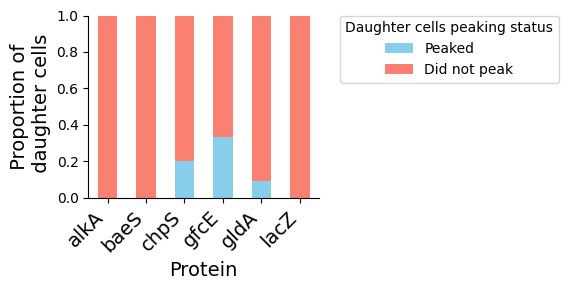

In [409]:
df = all_peaks_parent_daughter_df.copy()
# Identify peaking daughters and non-peaking daughters for each gene
peaking_daughters = df[df['daughter_peak_count'] > 0].groupby('gene').size().reset_index(name='peaking_daughters_count')
non_peaking_daughters = df[df['daughter_peak_count'] == 0].groupby('gene').size().reset_index(name='non_peaking_daughters_count')

# Merge the two DataFrames
proportions_df = pd.merge(peaking_daughters, non_peaking_daughters, on='gene', how='outer').fillna(0)

# Calculate proportions
proportions_df['total'] = proportions_df['peaking_daughters_count'] + proportions_df['non_peaking_daughters_count']
proportions_df['peaking_proportion'] = proportions_df['peaking_daughters_count'] / proportions_df['total']
proportions_df['non_peaking_proportion'] = proportions_df['non_peaking_daughters_count'] / proportions_df['total']

# Set gene as index for plotting
proportions_df.set_index('gene', inplace=True)

# Plot the stacked bar chart
fig, ax = plt.subplots(figsize=(6, 3))
proportions_df[['peaking_proportion', 'non_peaking_proportion']].plot(
    kind='bar',
    stacked=True,
    ax=ax,
    color=['skyblue', 'salmon']
)

# Set labels and title
ax.set_xlabel('Protein', fontsize=14)
ax.set_ylabel(' Proportion of \n daughter cells', fontsize=14)
ax.set_ylim(0, 1)
ax.set_xticklabels(proportions_df.index, rotation=45, ha='right')
ax.tick_params(axis='x', labelsize=14)

plt.legend(bbox_to_anchor=(1.09, 1), loc='upper left', borderaxespad=0, 
           title='Daughter cells peaking status',  labels=['Peaked', 'Did not peak'])
sns.despine();
plt.tight_layout()